In [ ]:
!pip install decord transformers torch pillow scipy easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.2/978.2 kB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.6/300.6 kB 18.6 MB/s eta 0:00:00


In [ ]:
"""
MaxInfo / no-training sampling for video frames (Python 3.12 friendly)

Pipeline:
1) Decode video with decord
2) Uniformly sample candidate frames at chosen FPS
3) Embed frames with CLIP
4) Reduce dim via SVD
5) Select informative frames via pivoted-QR row selection (MaxVol-like)
6) Optional cosine pruning
7) Return selected PIL frames + temporal id groups + indices

Deps:
  pip install decord transformers torch pillow scipy
"""

import math
import numpy as np
import torch
from PIL import Image
from decord import VideoReader, cpu
from scipy.spatial import cKDTree
from scipy.spatial.distance import cosine
from scipy.linalg import qr
from transformers import AutoProcessor, CLIPModel


# -----------------------------
# Video -> candidate frames
# -----------------------------
MAX_NUM_FRAMES = 128
MAX_NUM_PACKING = 1
TIME_SCALE = 0.1


def uniform_sample_indices(num_items: int, n: int) -> np.ndarray:
    if n <= 0:
        return np.array([], dtype=np.int64)
    gap = num_items / n
    idxs = [int(i * gap + gap / 2) for i in range(n)]
    idxs = np.clip(idxs, 0, num_items - 1)
    return np.array(idxs, dtype=np.int64)


def map_to_nearest_scale(values: np.ndarray, scale: np.ndarray) -> np.ndarray:
    tree = cKDTree(scale[:, None])
    _, indices = tree.query(values[:, None])
    return scale[indices]


def group_array(arr: np.ndarray, size: int):
    return [arr[i:i + size] for i in range(0, len(arr), size)]


def encode_video(
    video_path: str,
    choose_fps: float = 3.0,
    force_packing: int | None = None,
    max_num_frames: int = MAX_NUM_FRAMES,
    max_num_packing: int = MAX_NUM_PACKING,
    time_scale: float = TIME_SCALE,
):
    vr = VideoReader(video_path, ctx=cpu(0))
    fps = float(vr.get_avg_fps())
    num_total = len(vr)
    video_duration = num_total / fps

    # decide how many candidate frames to sample (bounded)
    if choose_fps * int(video_duration) <= max_num_frames:
        packing_nums = 1
        choose_frames = round(min(choose_fps, round(fps)) * min(max_num_frames, video_duration))
    else:
        packing_nums = math.ceil(video_duration * choose_fps / max_num_frames)
        if packing_nums <= max_num_packing:
            choose_frames = round(video_duration * choose_fps)
        else:
            choose_frames = round(max_num_frames * max_num_packing)
            packing_nums = max_num_packing

    if force_packing is not None:
        packing_nums = min(int(force_packing), max_num_packing)

    choose_frames = max(1, int(choose_frames))

    frame_idx = uniform_sample_indices(num_total, choose_frames)
    frames_np = vr.get_batch(frame_idx).asnumpy()

    frame_idx_ts = frame_idx.astype(np.float32) / fps
    scale = np.arange(0, max(video_duration, time_scale), time_scale, dtype=np.float32)
    snapped = map_to_nearest_scale(frame_idx_ts, scale)
    frame_ts_id = (snapped / time_scale).astype(np.int32)

    frames = [Image.fromarray(x.astype("uint8")).convert("RGB") for x in frames_np]
    frame_ts_id_group = group_array(frame_ts_id, packing_nums)

    # NOTE: frame_ts_id_group has length == len(frames) only if packing_nums == 1.
    # In your original notebook, packing_nums was typically 1 (MAX_NUM_PACKING=1).
    # If you increase packing, you'll need to adapt how you align temporal ids.
    if packing_nums != 1:
        # Keep the same behavior as your notebook: group ids but still index by frame.
        # Easiest compatibility: just return per-frame ids instead of grouped.
        frame_ts_id_group = [np.array([tid], dtype=np.int32) for tid in frame_ts_id]

    return frames, frame_ts_id_group


# -----------------------------
# Embedding + selection
# -----------------------------
import torch

def extract_clip_features(vision_model, vision_processor, frames, batch_size=16):
    """
    Robust CLIP image embedding extraction for transformers v5.
    Returns [num_frames, hidden_dim] float32 CPU tensor.
    """
    device = vision_model.device
    all_feats = []

    with torch.no_grad():
        for i in range(0, len(frames), batch_size):
            batch = frames[i:i + batch_size]
            inputs = vision_processor(images=batch, return_tensors="pt", padding=True)

            # move only tensor fields to device (processor may include non-tensors)
            inputs = {k: v.to(device) for k, v in inputs.items() if torch.is_tensor(v)}

            # Forward through vision encoder
            vision_out = vision_model.vision_model(pixel_values=inputs["pixel_values"])
            pooled = vision_out.pooler_output  # [B, vision_hidden]

            # Apply CLIP's visual projection -> final image embedding space
            feats = vision_model.visual_projection(pooled)  # [B, proj_dim]

            all_feats.append(feats.float().cpu())

    return torch.cat(all_feats, dim=0)  # [T, proj_dim]



def svd_reduce_dim(features: np.ndarray, r: int = 8) -> np.ndarray:
    U, S, Vt = np.linalg.svd(features, full_matrices=False)
    return U[:, :r]  # [T, r]


def select_rows_pivoted_qr(matrix: np.ndarray, k: int) -> list[int]:
    """
    MaxVol-like row selection using pivoted QR.

    matrix: [T, r]
    We want informative ROWS -> do pivoted QR on matrix^T (columns correspond to rows).
    """
    k = int(max(1, min(k, matrix.shape[0])))
    _, _, piv = qr(matrix.T, pivoting=True, mode="economic")  # piv indexes columns of matrix.T == rows of matrix
    return list(map(int, piv[:k]))


def filter_similar_frames(
    features: np.ndarray,
    selected_indices: list[int],
    similarity_threshold: float = 0.9,
) -> list[int]:
    if not selected_indices:
        return []
    filtered = [selected_indices[0]]
    for idx in selected_indices[1:]:
        sim = 1.0 - cosine(features[filtered[-1]], features[idx])
        if sim < similarity_threshold:
            filtered.append(idx)
    return filtered


def maxinfo_sample_frames(
    vision_model: CLIPModel,
    vision_processor: AutoProcessor,
    frames: list[Image.Image],
    frame_ts_id_group: list[np.ndarray],
    batch_size: int = 16,
    svd_rank: int = 8,
    num_select: int = 32,          # how many keyframes to keep (set this like your budget)
    remove_similar: bool = False,
    similarity_threshold: float = 0.9,
):
    if len(frames) == 0:
        return [], [], []

    feats_t = extract_clip_features(vision_model, vision_processor, frames, batch_size=batch_size)
    feats = feats_t.numpy()  # [T, D]

    low_dim = svd_reduce_dim(feats, r=svd_rank)  # [T, r]

    selected = select_rows_pivoted_qr(low_dim, k=num_select)
    selected = sorted(selected)

    if remove_similar and len(selected) > 1:
        selected = filter_similar_frames(feats, selected, similarity_threshold=similarity_threshold)

    selected_frames = [frames[i] for i in selected]
    selected_ts_group = [frame_ts_id_group[i] for i in selected]

    return selected_frames, selected_ts_group, selected


def maxinfo_sample_video(
    video_path: str,
    clip_model_name: str = "openai/clip-vit-large-patch14-336",
    choose_fps: float = 3.0,
    force_packing: int | None = None,
    batch_size: int = 16,
    svd_rank: int = 8,
    num_select: int = 32,
    remove_similar: bool = False,
    similarity_threshold: float = 0.9,
    device_map: str = "auto",
):
    vision_model = CLIPModel.from_pretrained(clip_model_name, device_map=device_map).eval()
    vision_processor = AutoProcessor.from_pretrained(clip_model_name)

    frames, frame_ts_id_group = encode_video(
        video_path=video_path,
        choose_fps=choose_fps,
        force_packing=force_packing,
    )

    return maxinfo_sample_frames(
        vision_model=vision_model,
        vision_processor=vision_processor,
        frames=frames,
        frame_ts_id_group=frame_ts_id_group,
        batch_size=batch_size,
        svd_rank=svd_rank,
        num_select=num_select,
        remove_similar=remove_similar,
        similarity_threshold=similarity_threshold,
    )



In [ ]:

# -----------------------------
# Example usage
# -----------------------------
if __name__ == "__main__":
    video_path = "/content/sample_long.mp4"  # <-- change this

    selected_frames, selected_ts_group, selected_indices = maxinfo_sample_video(
        video_path=video_path,
        choose_fps=3.0,
        force_packing=1,
        batch_size=16,
        svd_rank=8,
        num_select=32,
        remove_similar=False,
        device_map="auto",
    )

    print("Selected frames:", len(selected_frames))
    print("Selected indices:", selected_indices)


Loading weights:   0%|          | 0/590 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-large-patch14-336
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Selected frames: 32
Selected indices: [0, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 36, 38]


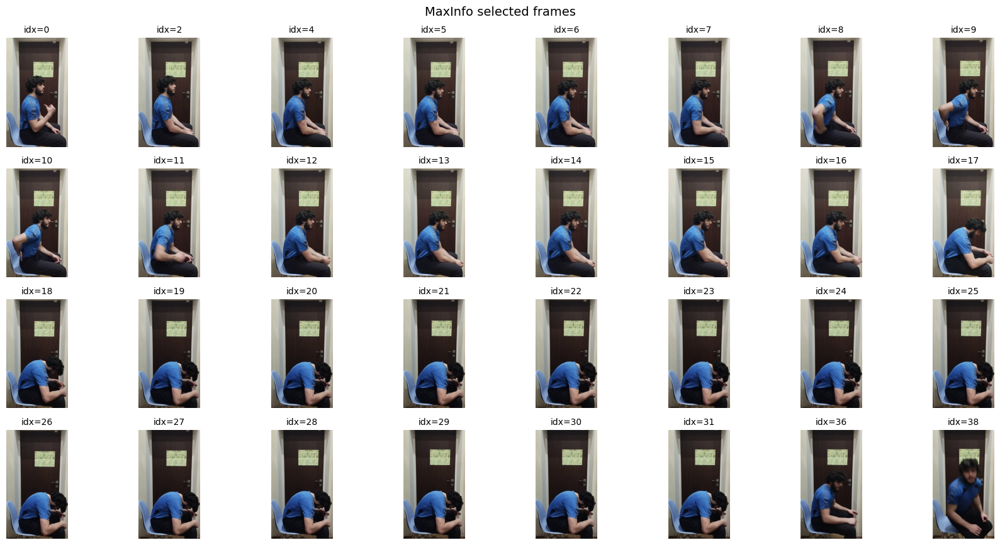

In [ ]:
import math
import matplotlib.pyplot as plt

def show_selected_frames_grid(frames, indices, cols=8, figsize_per_col=2.2, title="Selected frames"):
    """
    frames: list of PIL images (selected_frames)
    indices: list of ints (selected_indices) aligned with frames
    """
    assert len(frames) == len(indices)
    n = len(frames)
    rows = math.ceil(n / cols)

    fig_w = cols * figsize_per_col
    fig_h = rows * figsize_per_col
    plt.figure(figsize=(fig_w, fig_h))

    for i, (img, idx) in enumerate(zip(frames, indices), start=1):
        ax = plt.subplot(rows, cols, i)
        ax.imshow(img)
        ax.set_title(f"idx={idx}", fontsize=10)
        ax.axis("off")

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

# use it
show_selected_frames_grid(selected_frames, selected_indices, cols=8, title="MaxInfo selected frames")


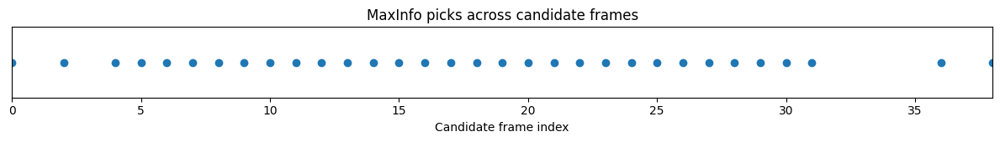

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def show_selection_timeline(selected_indices, total_candidates=None, title="Selection timeline"):
    """
    selected_indices: list[int]
    total_candidates: int or None (if you know how many candidate frames existed)
                     If None, uses max(selected_indices)+1
    """
    sel = np.array(selected_indices, dtype=int)
    if total_candidates is None:
        total_candidates = int(sel.max() + 1) if len(sel) else 1

    y = np.zeros_like(sel)

    plt.figure(figsize=(12, 1.8))
    plt.scatter(sel, y)
    plt.yticks([])
    plt.xlim(0, total_candidates - 1)
    plt.xlabel("Candidate frame index")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# use it
show_selection_timeline(selected_indices, title="MaxInfo picks across candidate frames")


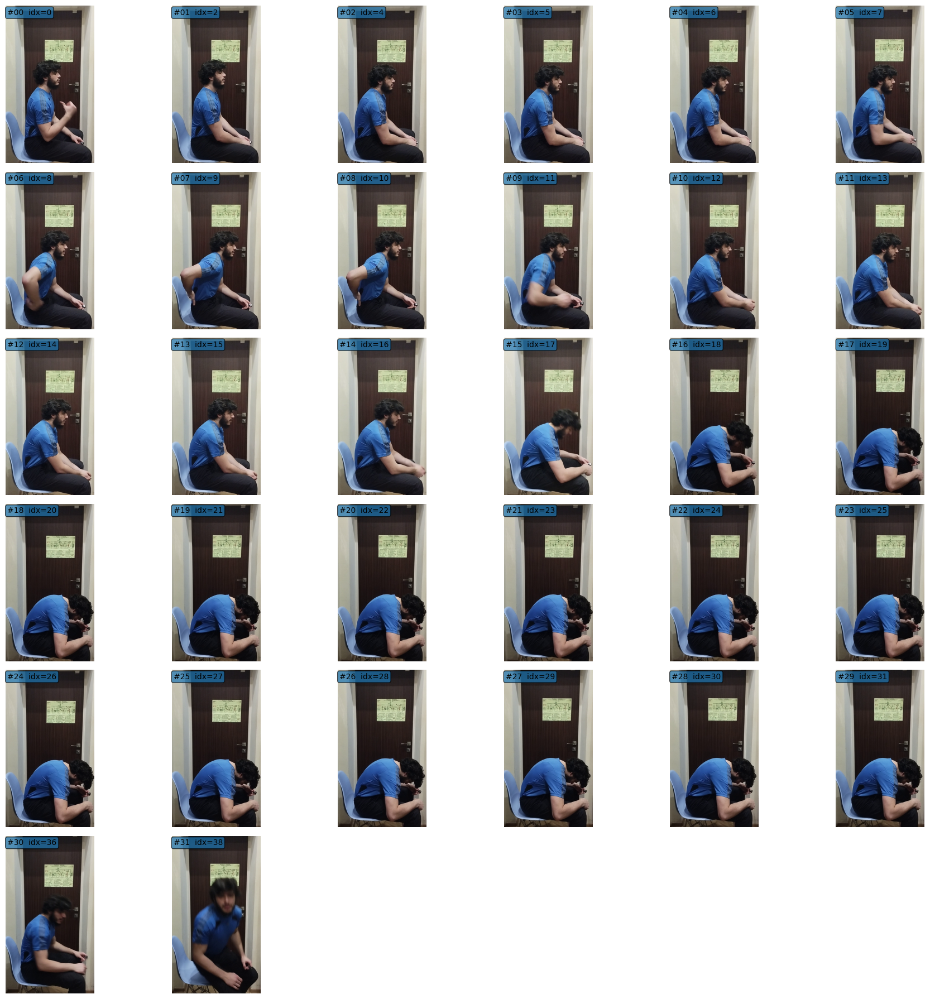

In [ ]:
import matplotlib.pyplot as plt
import math

def show_contact_sheet(frames, indices, cols=6):
    n = len(frames)
    rows = math.ceil(n / cols)
    plt.figure(figsize=(cols * 3, rows * 3))

    for i in range(n):
        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(frames[i])
        ax.axis("off")
        ax.text(
            0.02, 0.98,
            f"#{i:02d}  idx={indices[i]}",
            transform=ax.transAxes,
            va="top", ha="left",
            bbox=dict(boxstyle="round,pad=0.25", alpha=0.7),
            fontsize=10,
        )

    plt.tight_layout()
    plt.show()

show_contact_sheet(selected_frames, selected_indices, cols=6)


In [ ]:
import numpy as np

def uniform_sample_frames(frames, frame_ts_id_group, num_select):
    """
    Uniformly sample `num_select` frames from candidate frames.
    """
    T = len(frames)
    num_select = min(num_select, T)

    idxs = np.linspace(0, T - 1, num_select).astype(int).tolist()

    sampled_frames = [frames[i] for i in idxs]
    sampled_ts_group = [frame_ts_id_group[i] for i in idxs]

    return sampled_frames, sampled_ts_group, idxs


In [ ]:
import math
import matplotlib.pyplot as plt
import numpy as np

def show_frame_grid(frames, indices, title, cols=8):
    n = len(frames)
    rows = math.ceil(n / cols)

    plt.figure(figsize=(cols * 2.3, rows * 2.3))
    for i, (img, idx) in enumerate(zip(frames, indices)):
        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(f"idx={idx}", fontsize=9)
        ax.axis("off")

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


def show_timeline(uniform_idx, maxinfo_idx, total_frames):
    y0 = np.zeros(len(uniform_idx))
    y1 = np.ones(len(maxinfo_idx))

    plt.figure(figsize=(14, 2.4))
    plt.scatter(uniform_idx, y0, label="Uniform", alpha=0.8)
    plt.scatter(maxinfo_idx, y1, label="MaxInfo", alpha=0.8)

    plt.yticks([0, 1], ["Uniform", "MaxInfo"])
    plt.xlabel("Candidate frame index")
    plt.xlim(0, total_frames - 1)
    plt.legend()
    plt.title("Frame selection timeline")
    plt.tight_layout()
    plt.show()


In [ ]:
video_path = "/content/sample_long.mp4"  # <-- your video

# decode candidate frames ONCE
frames, frame_ts_id_group = encode_video(
    video_path=video_path,
    choose_fps=3.0,
    force_packing=1,
)

print(f"Total candidate frames: {len(frames)}")


Total candidate frames: 39


In [ ]:

import torch
from transformers import CLIPModel, AutoProcessor

CLIP_MODEL_NAME = "openai/clip-vit-large-patch14-336"

vision_model = CLIPModel.from_pretrained(
    CLIP_MODEL_NAME,
    device_map="auto"
).eval()

vision_processor = AutoProcessor.from_pretrained(CLIP_MODEL_NAME)

print("CLIP loaded on:", vision_model.device)
NUM_SELECT = 8  # same budget for both


selected_frames_mi, selected_ts_mi, selected_idx_mi = maxinfo_sample_frames(
    vision_model=vision_model,
    vision_processor=vision_processor,
    frames=frames,
    frame_ts_id_group=frame_ts_id_group,
    batch_size=16,
    svd_rank=8,
    num_select=NUM_SELECT,
    remove_similar=False,
)

print("MaxInfo indices:", selected_idx_mi)


Loading weights:   0%|          | 0/590 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-large-patch14-336
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


CLIP loaded on: cuda:0
MaxInfo indices: [0, 9, 11, 14, 26, 30, 36, 38]


In [ ]:
selected_frames_uni, selected_ts_uni, selected_idx_uni = uniform_sample_frames(
    frames,
    frame_ts_id_group,
    num_select=NUM_SELECT,
)

print("Uniform indices:", selected_idx_uni)


Uniform indices: [0, 5, 10, 16, 21, 27, 32, 38]


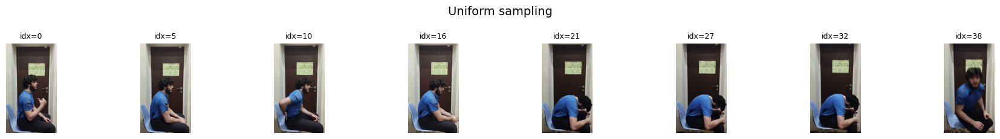

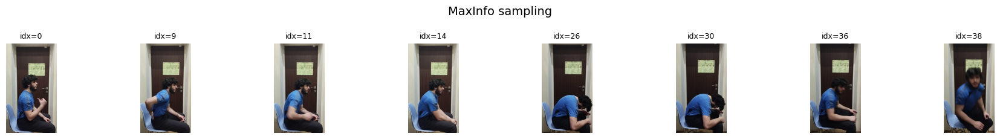

In [ ]:
show_frame_grid(
    selected_frames_uni,
    selected_idx_uni,
    title="Uniform sampling",
    cols=8,
)

show_frame_grid(
    selected_frames_mi,
    selected_idx_mi,
    title="MaxInfo sampling",
    cols=8,
)


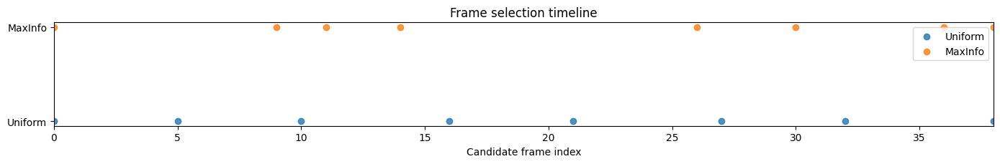

In [ ]:
show_timeline(
    uniform_idx=selected_idx_uni,
    maxinfo_idx=selected_idx_mi,
    total_frames=len(frames),
)


# Pipeline

In [ ]:
# Pipeline cell: compare Uniform vs MaxInfo on ANY video path (Colab-ready, all defs included)

import math, numpy as np, torch
import matplotlib.pyplot as plt
from PIL import Image
from decord import VideoReader, cpu
from scipy.spatial import cKDTree
from scipy.spatial.distance import cosine
from scipy.linalg import qr
from transformers import AutoProcessor, CLIPModel

# -----------------------------
# Core utils (decode + ids)
# -----------------------------
TIME_SCALE = 0.1

def _uniform_sample_indices(num_items: int, n: int) -> np.ndarray:
    gap = num_items / n
    idxs = [int(i * gap + gap / 2) for i in range(n)]
    return np.clip(idxs, 0, num_items - 1).astype(np.int64)

def _map_to_nearest_scale(values: np.ndarray, scale: np.ndarray) -> np.ndarray:
    tree = cKDTree(scale[:, None])
    _, indices = tree.query(values[:, None])
    return scale[indices]

def encode_video_candidates(
    video_path: str,
    choose_fps: float = 3.0,
    max_candidates: int = 256,   # candidate pool size (before selecting budget)
    time_scale: float = TIME_SCALE,
):
    vr = VideoReader(video_path, ctx=cpu(0))
    fps = float(vr.get_avg_fps())
    num_total = len(vr)
    duration = num_total / fps

    # how many candidates to sample at choose_fps, capped by max_candidates
    desired = int(round(duration * choose_fps))
    num_candidates = max(1, min(max_candidates, desired))

    frame_idx = _uniform_sample_indices(num_total, num_candidates)
    frames_np = vr.get_batch(frame_idx).asnumpy()

    # timestamps (seconds) -> temporal ids (0.1s ticks by default)
    ts = frame_idx.astype(np.float32) / fps
    scale = np.arange(0, max(duration, time_scale), time_scale, dtype=np.float32)
    snapped = _map_to_nearest_scale(ts, scale)
    ts_id = (snapped / time_scale).astype(np.int32)

    frames = [Image.fromarray(x.astype("uint8")).convert("RGB") for x in frames_np]
    ts_group = [np.array([t], dtype=np.int32) for t in ts_id]  # per-frame id group

    return frames, ts_group, frame_idx, ts  # include original frame_idx + timestamps for plotting


# -----------------------------
# CLIP embeddings (transformers v5 safe)
# -----------------------------
def extract_clip_features(vision_model, vision_processor, frames, batch_size=16):
    device = vision_model.device
    all_feats = []
    with torch.no_grad():
        for i in range(0, len(frames), batch_size):
            batch = frames[i:i + batch_size]
            inputs = vision_processor(images=batch, return_tensors="pt", padding=True)
            inputs = {k: v.to(device) for k, v in inputs.items() if torch.is_tensor(v)}
            vision_out = vision_model.vision_model(pixel_values=inputs["pixel_values"])
            pooled = vision_out.pooler_output
            feats = vision_model.visual_projection(pooled)
            all_feats.append(feats.float().cpu())
    return torch.cat(all_feats, dim=0)  # [T, D]


# -----------------------------
# MaxInfo-like selection: SVD + pivoted-QR (row selection)
# -----------------------------
def svd_reduce_dim(features: np.ndarray, r: int = 8) -> np.ndarray:
    U, S, Vt = np.linalg.svd(features, full_matrices=False)
    return U[:, :r]

def select_rows_pivoted_qr(matrix: np.ndarray, k: int) -> list[int]:
    k = int(max(1, min(k, matrix.shape[0])))
    _, _, piv = qr(matrix.T, pivoting=True, mode="economic")  # columns of matrix.T are rows of matrix
    return list(map(int, piv[:k]))

def filter_similar_frames(features: np.ndarray, selected: list[int], thr: float = 0.9) -> list[int]:
    if not selected:
        return []
    kept = [selected[0]]
    for idx in selected[1:]:
        sim = 1.0 - cosine(features[kept[-1]], features[idx])
        if sim < thr:
            kept.append(idx)
    return kept

def maxinfo_select(
    vision_model,
    vision_processor,
    frames,
    ts_group,
    budget: int = 32,
    svd_rank: int = 8,
    batch_size: int = 16,
    remove_similar: bool = False,
    similarity_thr: float = 0.9,
):
    feats = extract_clip_features(vision_model, vision_processor, frames, batch_size=batch_size).numpy()
    low = svd_reduce_dim(feats, r=svd_rank)
    idx = sorted(select_rows_pivoted_qr(low, k=min(budget, len(frames))))
    if remove_similar and len(idx) > 1:
        idx = filter_similar_frames(feats, idx, thr=similarity_thr)
    sel_frames = [frames[i] for i in idx]
    sel_ts = [ts_group[i] for i in idx]
    return sel_frames, sel_ts, idx


# -----------------------------
# Uniform baseline
# -----------------------------
def uniform_select(frames, ts_group, budget: int = 32):
    T = len(frames)
    k = min(budget, T)
    idx = np.linspace(0, T - 1, k).astype(int).tolist()
    return [frames[i] for i in idx], [ts_group[i] for i in idx], idx


# -----------------------------
# Visualizations
# -----------------------------
def show_grid(frames, idx, title, cols=8):
    n = len(frames)
    rows = math.ceil(n / cols)
    plt.figure(figsize=(cols * 2.25, rows * 2.25))
    for i, (im, j) in enumerate(zip(frames, idx), start=1):
        ax = plt.subplot(rows, cols, i)
        ax.imshow(im)
        ax.set_title(f"cand={j}", fontsize=9)
        ax.axis("off")
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

def show_timeline(uniform_idx, maxinfo_idx, total_candidates, title="Selection timeline"):
    u = np.array(uniform_idx, dtype=int)
    m = np.array(maxinfo_idx, dtype=int)
    plt.figure(figsize=(14, 2.4))
    plt.scatter(u, np.zeros_like(u), label="Uniform", alpha=0.85)
    plt.scatter(m, np.ones_like(m), label="MaxInfo", alpha=0.85)
    plt.yticks([0, 1], ["Uniform", "MaxInfo"])
    plt.xlim(0, total_candidates - 1)
    plt.xlabel("Candidate frame index")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()



# =============================
# Video subsection support
# =============================
from decord import VideoReader, cpu
import numpy as np

def load_video_segment(
    video_path: str,
    fps_sample: float = 1.0,         # “choose_fps”
    max_candidates: int = 256,
    start_sec: float | None = None,
    end_sec: float | None = None,
    force_sample: bool = True,
):
    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    native_fps = float(vr.get_avg_fps())
    total_frames = len(vr)
    duration = total_frames / native_fps

    # clamp segment
    s = 0.0 if start_sec is None else max(0.0, float(start_sec))
    e = duration if end_sec is None else min(duration, float(end_sec))
    if e <= s:
        raise ValueError(
            f"Invalid segment: start_sec={s}, end_sec={e}, duration={duration:.2f}"
        )

    start_f = int(round(s * native_fps))
    end_f = int(round(e * native_fps))
    end_f = min(end_f, total_frames)

    # sample indices in the segment at approx fps_sample
    step = max(1, int(round(native_fps / fps_sample)))
    frame_idx = list(range(start_f, end_f, step))

    # cap to max_candidates uniformly over the SEGMENT
    if force_sample and len(frame_idx) > max_candidates:
        frame_idx = np.linspace(start_f, end_f - 1, max_candidates, dtype=int).tolist()

    frames = vr.get_batch(frame_idx).asnumpy()  # (T, H, W, 3)
    times = [i / native_fps for i in frame_idx]
    return frames, times, frame_idx, (s, e), duration


# =============================
# Candidate encoding wrapper
# (updated to use segment loader)
# =============================
def encode_video_candidates(
    video_path: str,
    choose_fps: float = 3.0,
    max_candidates: int = 256,
    start_sec: float | None = None,
    end_sec: float | None = None,
):
    """
    Returns:
      frames: np.ndarray (N, H, W, 3)
      ts_group: list[float] same as timestamps (kept for your downstream code)
      orig_frame_idx: list[int] indices in the original full video
      timestamps: list[float] seconds in the original full video
    """
    frames, timestamps, orig_frame_idx, (seg_s, seg_e), duration = load_video_segment(
        video_path=video_path,
        fps_sample=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        force_sample=True,
    )

    ts_group = timestamps  # keep your naming
    return frames, ts_group, orig_frame_idx, timestamps


# =============================
# Your compare function
# (only changes: add start/end params + pass through)
# =============================
# assumes you already defined/imported:
# uniform_select, maxinfo_select, show_grid, show_timeline
# and _vision_model/_vision_processor are loaded elsewhere
_CLIP_MODEL_NAME = "openai/clip-vit-large-patch14-336"
_vision_model = CLIPModel.from_pretrained(_CLIP_MODEL_NAME, device_map="auto").eval()
_vision_processor = AutoProcessor.from_pretrained(_CLIP_MODEL_NAME)

def compare_sampling_on_video(
    video_path: str,
    choose_fps: float = 3.0,
    max_candidates: int = 256,
    budget: int = 32,
    svd_rank: int = 8,
    batch_size: int = 16,
    remove_similar: bool = False,
    similarity_thr: float = 0.9,
    cols: int = 8,
    show: bool = True,
    start_sec: float | None = None,
    end_sec: float | None = None,
):
    """
    Compare uniform vs MaxInfo on either full video or a subsection.
    """

    frames, ts_group, orig_frame_idx, timestamps = encode_video_candidates(
        video_path=video_path,
        choose_fps=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
    )

    uni_frames, uni_ts, uni_idx = uniform_select(frames, ts_group, budget=budget)

    mi_frames, mi_ts, mi_idx = maxinfo_select(
        vision_model=_vision_model,
        vision_processor=_vision_processor,
        frames=frames,
        ts_group=ts_group,
        budget=budget,
        svd_rank=svd_rank,
        batch_size=batch_size,
        remove_similar=remove_similar,
        similarity_thr=similarity_thr,
    )

    if show:
        seg_label = (
            f"[{start_sec:.2f}s–{end_sec:.2f}s]"
            if (start_sec is not None or end_sec is not None)
            else "[full]"
        )
        show_grid(uni_frames, uni_idx, title=f"Uniform (budget={budget}) {seg_label} — {video_path}", cols=cols)
        show_grid(mi_frames, mi_idx, title=f"MaxInfo (budget={budget}) {seg_label} — {video_path}", cols=cols)
        show_timeline(
            uni_idx,
            mi_idx,
            total_candidates=len(frames),
            title=f"Uniform vs MaxInfo timeline {seg_label} — {video_path}",
        )

    return {
        "video_path": video_path,
        "segment": {
            "start_sec": 0.0 if start_sec is None else float(start_sec),
            "end_sec": None if end_sec is None else float(end_sec),
        },
        "candidates": {
            "num": len(frames),
            "orig_frame_idx": orig_frame_idx,  # candidate -> original full-video frame index
            "timestamps": timestamps,          # candidate -> seconds in full video
        },
        "uniform": {
            "indices": uni_idx,
            "frames": uni_frames,
            "ts_group": uni_ts,
        },
        "maxinfo": {
            "indices": mi_idx,
            "frames": mi_frames,
            "ts_group": mi_ts,
        },
    }



/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


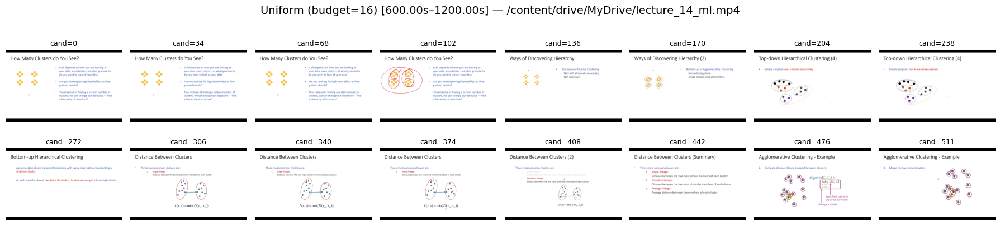

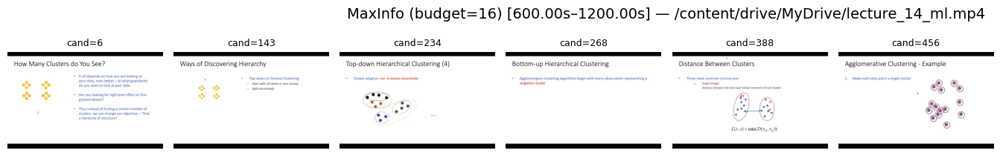

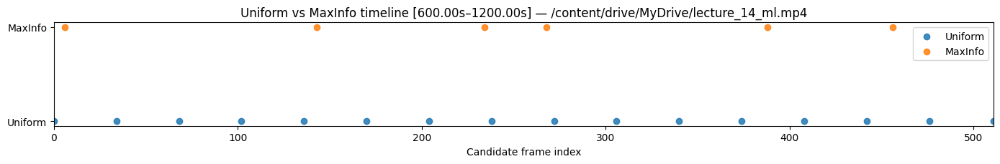

In [ ]:

# =============================
# Example usage
# =============================
# Run on minute 10 to minute 20 only:
out = compare_sampling_on_video(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=1.0,
    max_candidates=512,
    budget=16,
    svd_rank=6,
    batch_size=16,
    remove_similar=True,
    start_sec=10*60,
    end_sec=20*60,
)



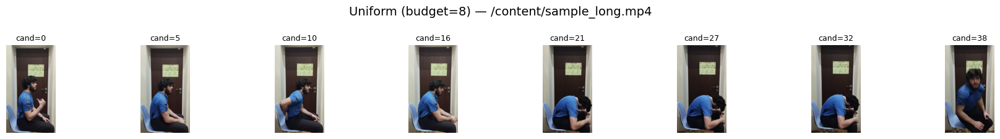

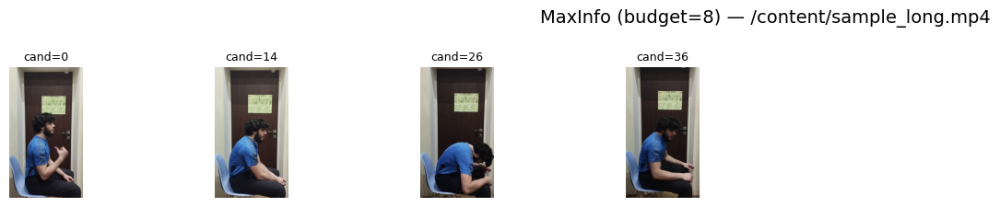

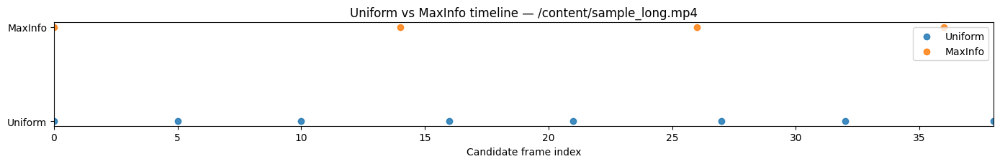

In [ ]:
out = compare_sampling_on_video(
    video_path="/content/sample_long.mp4",
    choose_fps=3.0,
    max_candidates=256,
    budget=8,
    svd_rank=8,
    batch_size=16,
    remove_similar=True,
)


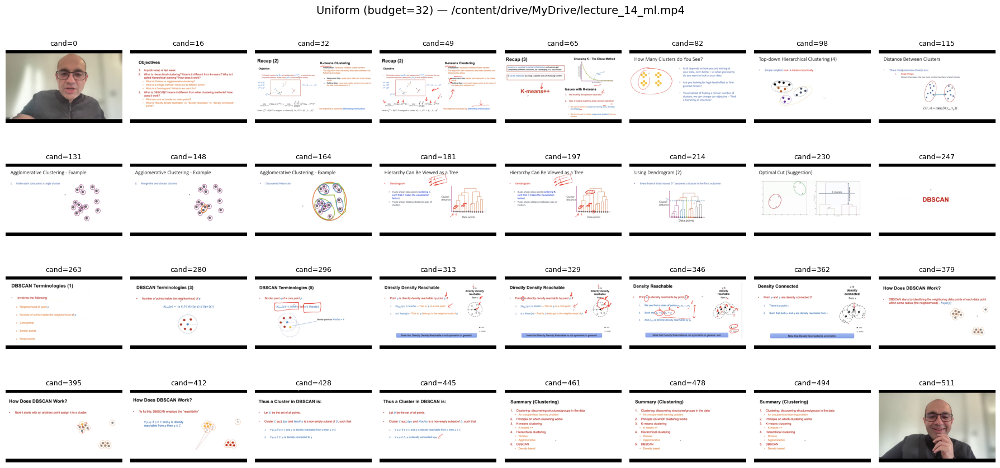

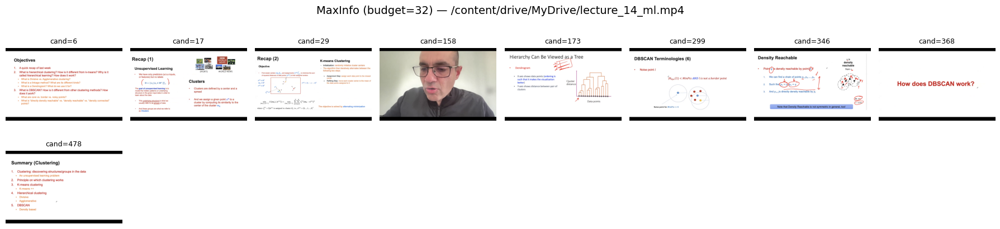

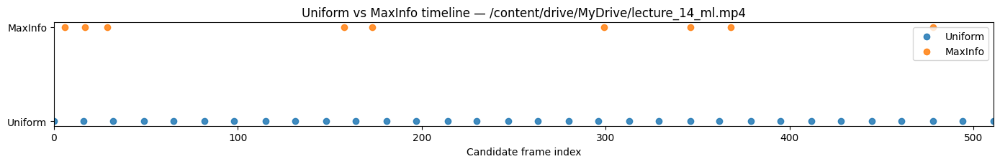

In [ ]:
out = compare_sampling_on_video(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",

    choose_fps=1.0,
    max_candidates=512,
    budget=32,
    svd_rank=6,
    batch_size=16,
    remove_similar=True,
)


# Textual content classification

/usr/local/lib/python3.12/dist-packages/sklearn/decomposition/_pca.py:789: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


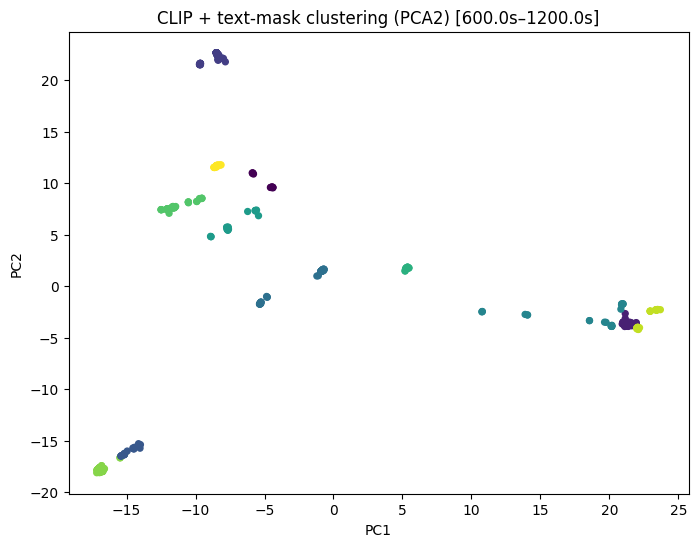

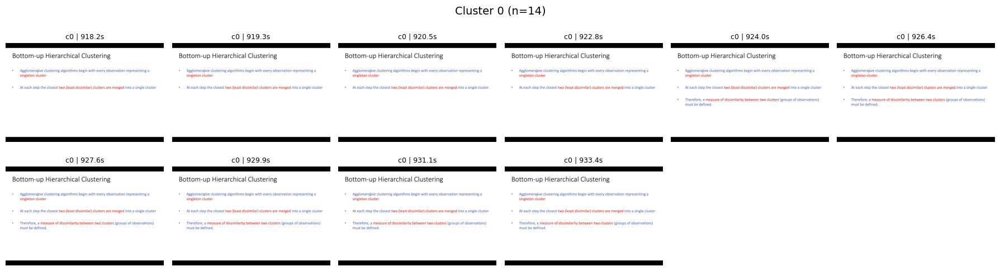

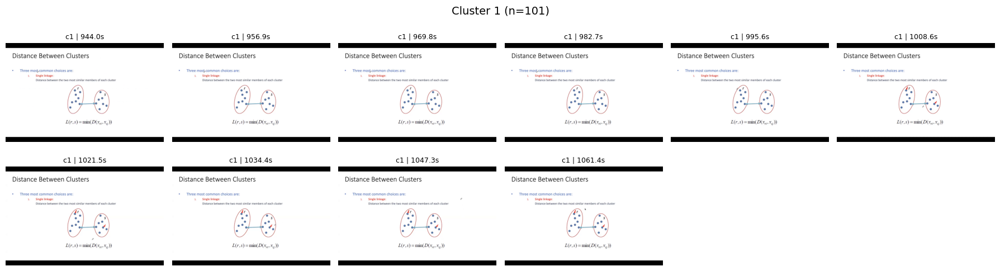

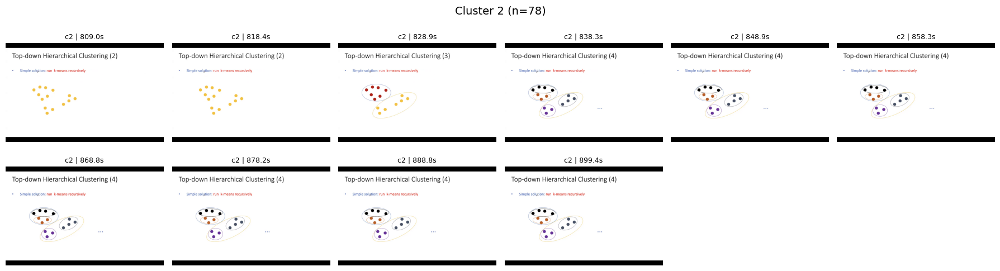

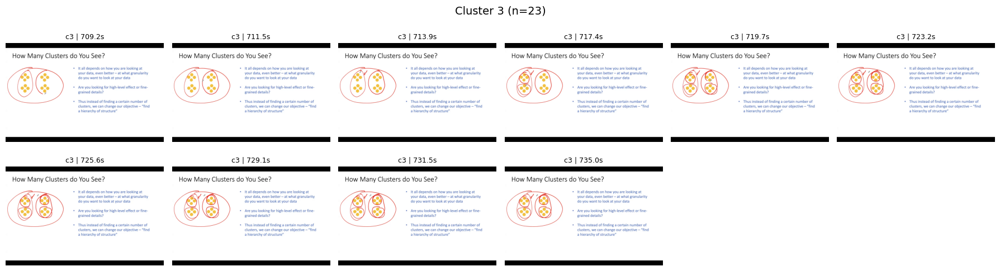

...

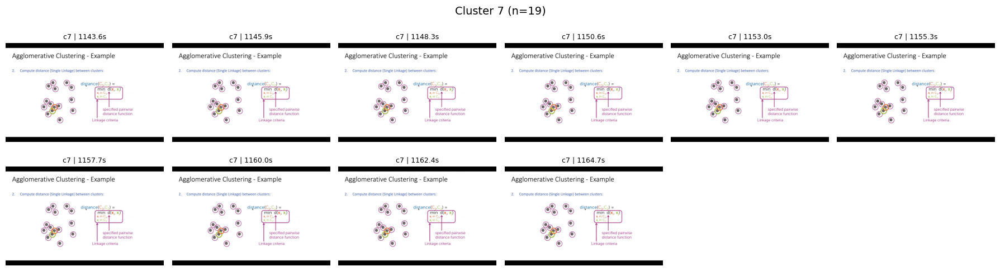

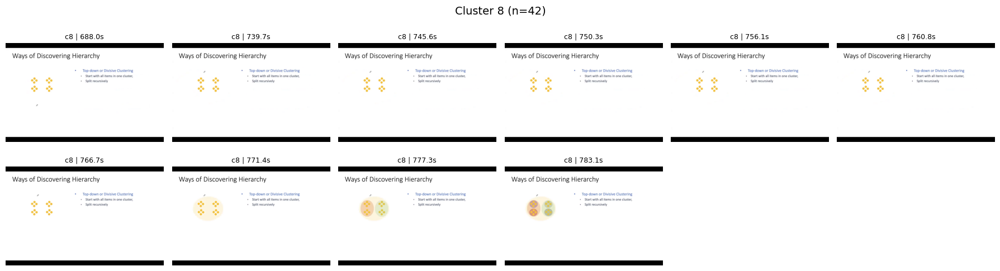

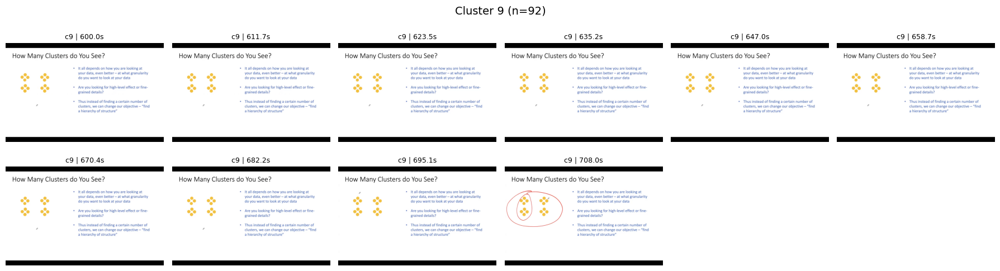

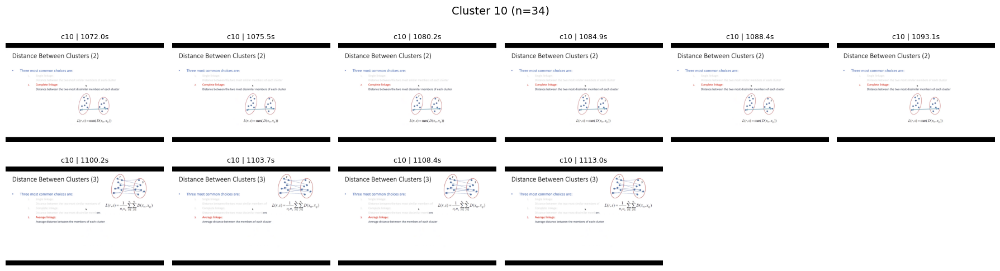

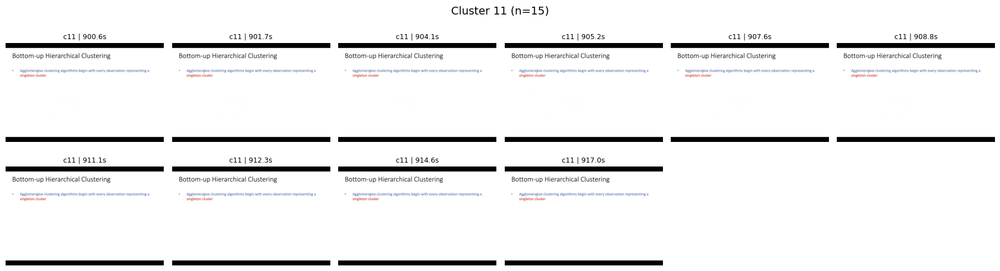

In [ ]:
# ============================================================
# FULLY RUNNABLE: classify frames (CLIP + text-sensitive) and visualize
# Works end-to-end in Colab/Jupyter with a local video path.
#
# What it does:
# 1) Loads frames from a video (optionally a subsection) using decord
# 2) Extracts CLIP image embeddings (semantic/layout)
# 3) Extracts a text-sensitive "mask" embedding (different text => different feature)
# 4) Concats + scales features, clusters with KMeans
# 5) Visualizes PCA scatter + montage per cluster
#
# Install deps (Colab):
#   !pip -q install decord transformers accelerate scikit-learn opencv-python pillow matplotlib
# ============================================================

import os
import math
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

from PIL import Image
from decord import VideoReader, cpu
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from transformers import CLIPModel, AutoProcessor

# ----------------------------
# 1) Video loading (subsection)
# ----------------------------
def load_video_segment(
    video_path: str,
    fps_sample: float = 1.0,
    max_candidates: int = 256,
    start_sec: float | None = None,
    end_sec: float | None = None,
    force_sample: bool = True,
):
    """
    Returns:
      frames: np.ndarray (N, H, W, 3) RGB uint8
      timestamps: list[float] seconds
      orig_frame_idx: list[int] frame indices in original video
      segment: (start_sec, end_sec) actually used
      duration: float seconds
      native_fps: float
    """
    if not os.path.exists(video_path):
        raise FileNotFoundError(f"Video not found: {video_path}")

    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    native_fps = float(vr.get_avg_fps())
    total_frames = len(vr)
    duration = total_frames / native_fps

    s = 0.0 if start_sec is None else max(0.0, float(start_sec))
    e = duration if end_sec is None else min(duration, float(end_sec))
    if e <= s:
        raise ValueError(f"Invalid segment: start_sec={s}, end_sec={e}, duration={duration:.2f}")

    start_f = int(round(s * native_fps))
    end_f = int(round(e * native_fps))
    end_f = min(end_f, total_frames)

    step = max(1, int(round(native_fps / float(fps_sample))))
    frame_idx = list(range(start_f, end_f, step))

    if force_sample and len(frame_idx) > int(max_candidates):
        frame_idx = np.linspace(start_f, end_f - 1, int(max_candidates), dtype=int).tolist()

    if len(frame_idx) == 0:
        raise ValueError("No frames selected (segment too small or fps_sample too low).")

    frames = vr.get_batch(frame_idx).asnumpy()  # RGB uint8
    timestamps = [i / native_fps for i in frame_idx]
    return frames, timestamps, frame_idx, (s, e), duration, native_fps


# --------------------------------------------
# 2) Text-sensitive features (different text!)
# --------------------------------------------
def text_mask_feature(frame_rgb: np.ndarray, out_size=(64, 64)) -> np.ndarray:
    """
    Produces a compact feature that is sensitive to text differences
    even when slide template/layout is similar.

    Steps:
    - grayscale
    - top-hat (emphasize small bright/dark structures like text strokes)
    - adaptive threshold
    - resize to small binary map
    """
    img = frame_rgb
    if img.dtype != np.uint8:
        img = img.astype(np.uint8)

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 9))
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)

    bw = cv2.adaptiveThreshold(
        tophat, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        31, 2
    )

    bw_small = cv2.resize(bw, out_size, interpolation=cv2.INTER_AREA)
    feat = (bw_small > 0).astype(np.float32).flatten()
    return feat

def batch_text_features(frames_rgb: np.ndarray, out_size=(64, 64)) -> np.ndarray:
    feats = [text_mask_feature(frames_rgb[i], out_size=out_size) for i in range(len(frames_rgb))]
    return np.stack(feats, axis=0)  # (N, out_size[0]*out_size[1])


# ----------------------------
# 3) CLIP image embeddings
# ----------------------------
def load_clip(model_name="openai/clip-vit-large-patch14-336"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = CLIPModel.from_pretrained(model_name).to(device).eval()
    processor = AutoProcessor.from_pretrained(model_name)
    return model, processor, device

@torch.no_grad()
def batch_clip_features(
    vision_model: CLIPModel,
    vision_processor: AutoProcessor,
    frames_rgb: np.ndarray,
    batch_size: int = 16,
    device: torch.device | None = None,
) -> np.ndarray:
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    feats = []
    n = len(frames_rgb)
    for i in range(0, n, batch_size):
        batch = [frames_rgb[j] for j in range(i, min(i + batch_size, n))]
        inputs = vision_processor(images=batch, return_tensors="pt", padding=True).to(device)
        f = vision_model.get_image_features(**inputs)  # (B, d)
        f = torch.nn.functional.normalize(f, dim=-1)
        feats.append(f.detach().cpu().float().numpy())

    return np.concatenate(feats, axis=0).astype(np.float32)


# ----------------------------
# 4) Clustering + projection
# ----------------------------
def cluster_frames(
    clip_feats: np.ndarray,
    text_feats: np.ndarray,
    n_clusters: int = 10,
    text_weight: float = 3.0,
    text_pca_dim: int = 64,
    random_state: int = 0,
):
    """
    Combine CLIP (semantic/layout) + text features (text-sensitive),
    then cluster using KMeans.
    """
    # scale CLIP
    clip_scaled = StandardScaler().fit_transform(clip_feats)

    # reduce + scale text
    text_pca = PCA(n_components=min(text_pca_dim, text_feats.shape[1]), random_state=random_state)
    text_reduced = text_pca.fit_transform(text_feats)
    text_scaled = StandardScaler().fit_transform(text_reduced) * float(text_weight)

    X = np.concatenate([clip_scaled, text_scaled], axis=1)

    km = KMeans(n_clusters=int(n_clusters), random_state=random_state, n_init="auto")
    labels = km.fit_predict(X)

    pca2 = PCA(n_components=2, random_state=random_state)
    X2 = pca2.fit_transform(X)

    return labels, X2, X


# ----------------------------
# 5) Visualization helpers
# ----------------------------
def plot_scatter(X2: np.ndarray, labels: np.ndarray, title="Frame clusters (PCA2)"):
    plt.figure(figsize=(8, 6))
    plt.scatter(X2[:, 0], X2[:, 1], c=labels, s=18)
    plt.title(title)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.show()

def show_cluster_montages(
    frames_rgb: np.ndarray,
    labels: np.ndarray,
    timestamps: list[float] | None = None,
    per_cluster: int = 12,
    max_clusters: int = 50,
    cols: int = 6,
):
    uniq = np.unique(labels)
    uniq = uniq[:max_clusters]

    for c in uniq:
        idx = np.where(labels == c)[0]
        if len(idx) == 0:
            continue

        # evenly sample per_cluster from cluster
        take = idx if len(idx) <= per_cluster else idx[np.linspace(0, len(idx) - 1, per_cluster, dtype=int)]
        rows = int(math.ceil(len(take) / cols))

        plt.figure(figsize=(cols * 3.0, rows * 2.6))
        for j, k in enumerate(take):
            ax = plt.subplot(rows, cols, j + 1)
            ax.imshow(frames_rgb[k])
            if timestamps is None:
                ax.set_title(f"c{c} | #{k}", fontsize=9)
            else:
                ax.set_title(f"c{c} | {timestamps[k]:.1f}s", fontsize=9)
            ax.axis("off")

        plt.suptitle(f"Cluster {c} (n={len(idx)})", fontsize=14)
        plt.tight_layout()
        plt.show()


# ----------------------------
# 6) One-call runner
# ----------------------------
def classify_and_visualize_video(
    video_path: str,
    choose_fps: float = 1.0,
    max_candidates: int = 512,
    start_sec: float | None = None,
    end_sec: float | None = None,
    clip_model_name: str = "openai/clip-vit-large-patch14-336",
    batch_size: int = 16,
    n_clusters: int = 10,
    text_mask_size=(64, 64),
    text_weight: float = 3.0,
    text_pca_dim: int = 64,
    per_cluster: int = 12,
):
    frames, timestamps, orig_frame_idx, segment, duration, native_fps = load_video_segment(
        video_path=video_path,
        fps_sample=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        force_sample=True,
    )

    vision_model, vision_processor, device = load_clip(clip_model_name)

    clip_feats = batch_clip_features(
        vision_model=vision_model,
        vision_processor=vision_processor,
        frames_rgb=frames,
        batch_size=batch_size,
        device=device,
    )

    text_feats = batch_text_features(frames, out_size=text_mask_size)

    labels, X2, X = cluster_frames(
        clip_feats=clip_feats,
        text_feats=text_feats,
        n_clusters=n_clusters,
        text_weight=text_weight,
        text_pca_dim=text_pca_dim,
        random_state=0,
    )

    seg_label = f"[{segment[0]:.1f}s–{segment[1]:.1f}s]" if (start_sec is not None or end_sec is not None) else "[full]"
    plot_scatter(X2, labels, title=f"CLIP + text-mask clustering (PCA2) {seg_label}")

    show_cluster_montages(
        frames_rgb=frames,
        labels=labels,
        timestamps=timestamps,
        per_cluster=per_cluster,
        cols=6,
    )

    return {
        "video_path": video_path,
        "segment": {"start_sec": segment[0], "end_sec": segment[1], "duration_sec": duration, "native_fps": native_fps},
        "candidates": {"num": len(frames), "orig_frame_idx": orig_frame_idx, "timestamps": timestamps},
        "features": {"clip": clip_feats, "text_mask": text_feats, "combined": X, "pca2": X2},
        "labels": labels,
        "frames": frames,  # keep for downstream debugging/selection
    }


# ============================================================
# EXAMPLE (edit your path)
# ============================================================
res = classify_and_visualize_video(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=1.0,
    max_candidates=512,
    start_sec=10*60,
    end_sec=20*60,
    batch_size=16,
    n_clusters=12,
    text_weight=4.0,       # bump if different-text slides still cluster together
    per_cluster=10,
)
#
# After you run, inspect:
#   res["labels"]
#   res["candidates"]["timestamps"]
# ============================================================


In [ ]:
# ============================================================
# FULLY RUNNABLE: Accurate "textual" vs "non-textual" per frame
# Uses EasyOCR (deep text detection + recognition)
#
# Colab installs:
#   !pip -q install decord easyocr opencv-python matplotlib numpy
#
# Notes:
# - First run downloads EasyOCR model weights.
# - This is slower than heuristics, but far more accurate.
# - You can speed it up by lowering fps_sample or max_candidates.
# ============================================================

import os
import math
import numpy as np
import cv2
import matplotlib.pyplot as plt
from decord import VideoReader, cpu

# EasyOCR (deep text detector+recognizer)
import easyocr
import torch


# ----------------------------
# 1) Load frames from video (optional subsection)
# ----------------------------
def load_video_segment(
    video_path: str,
    fps_sample: float = 1.0,
    max_candidates: int = 512,
    start_sec: float | None = None,
    end_sec: float | None = None,
    force_sample: bool = True,
):
    if not os.path.exists(video_path):
        raise FileNotFoundError(f"Video not found: {video_path}")

    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    native_fps = float(vr.get_avg_fps())
    total_frames = len(vr)
    duration = total_frames / native_fps

    s = 0.0 if start_sec is None else max(0.0, float(start_sec))
    e = duration if end_sec is None else min(duration, float(end_sec))
    if e <= s:
        raise ValueError(f"Invalid segment: start_sec={s}, end_sec={e}, duration={duration:.2f}")

    start_f = int(round(s * native_fps))
    end_f = int(round(e * native_fps))
    end_f = min(end_f, total_frames)

    step = max(1, int(round(native_fps / float(fps_sample))))
    frame_idx = list(range(start_f, end_f, step))

    if force_sample and len(frame_idx) > int(max_candidates):
        frame_idx = np.linspace(start_f, end_f - 1, int(max_candidates), dtype=int).tolist()

    if len(frame_idx) == 0:
        raise ValueError("No frames selected (segment too small or fps too low).")

    frames = vr.get_batch(frame_idx).asnumpy()  # RGB uint8
    timestamps = [i / native_fps for i in frame_idx]
    return frames, timestamps, frame_idx, (s, e), duration, native_fps


# ----------------------------
# 2) EasyOCR labeling
# ----------------------------
def _poly_area(poly):
    """
    poly: list of 4 points [[x,y],...]
    """
    pts = np.array(poly, dtype=np.float32)
    x = pts[:, 0]
    y = pts[:, 1]
    return float(0.5 * abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1))))

def label_frames_text_easyocr(
    frames_rgb: np.ndarray,
    reader: easyocr.Reader,
    conf_thr: float = 0.40,
    min_text_area_frac: float = 0.0005,
    min_chars: int = 2,
    detail: int = 1,
):
    """
    For each frame:
      - run EasyOCR readtext
      - compute:
          * has_text: any detection with confidence >= conf_thr
                      AND text length >= min_chars
                      AND bbox area >= min_text_area_frac * image_area
      - return scores + labels + raw detections

    Output:
      labels: np.array of "textual"/"non-textual"
      scores: np.array in [0,1] = max confidence among valid detections (0 if none)
      dets:   list of detections per frame (for debugging)
    """
    labels = []
    scores = []
    dets_all = []

    H, W = frames_rgb[0].shape[:2]
    img_area = float(H * W)
    min_area = min_text_area_frac * img_area

    for i in range(len(frames_rgb)):
        # EasyOCR expects BGR or RGB; works with RGB, but we pass BGR to be safe.
        bgr = cv2.cvtColor(frames_rgb[i], cv2.COLOR_RGB2BGR)

        dets = reader.readtext(bgr, detail=detail)  # each: [bbox, text, conf]
        dets_all.append(dets)

        best = 0.0
        has = False

        for d in dets:
            bbox, text, conf = d[0], d[1], float(d[2])

            if conf < conf_thr:
                continue
            if text is None:
                continue

            t = str(text).strip()
            if len(t) < min_chars:
                continue

            area = _poly_area(bbox)
            if area < min_area:
                continue

            has = True
            best = max(best, conf)

        labels.append("textual" if has else "non-textual")
        scores.append(best if has else 0.0)

    return np.array(labels), np.array(scores, dtype=np.float32), dets_all


# ----------------------------
# 3) Visualization
# ----------------------------
def plot_text_timeline(timestamps, scores, title="Text confidence over time"):
    plt.figure(figsize=(10, 3))
    plt.plot(timestamps, scores)
    plt.ylim(0, 1.05)
    plt.xlabel("time (s)")
    plt.ylabel("max text conf")
    plt.title(title)
    plt.show()

def show_samples(frames_rgb, timestamps, scores, labels, which="textual", k=12, cols=6):
    idx = np.where(labels == which)[0]
    if len(idx) == 0:
        print(f"No frames labeled '{which}'.")
        return

    take = idx if len(idx) <= k else idx[np.linspace(0, len(idx) - 1, k, dtype=int)]
    rows = int(math.ceil(len(take) / cols))

    plt.figure(figsize=(cols * 3.0, rows * 2.6))
    for j, i in enumerate(take):
        ax = plt.subplot(rows, cols, j + 1)
        ax.imshow(frames_rgb[i])
        ax.set_title(f"{which}\n{timestamps[i]:.1f}s | {scores[i]:.2f}", fontsize=9)
        ax.axis("off")
    plt.suptitle(f"Samples: {which} (n={len(idx)})", fontsize=14)
    plt.tight_layout()
    plt.show()


# ----------------------------
# 4) End-to-end runner
# ----------------------------
def label_video_text_nontext(
    video_path: str,
    choose_fps: float = 1.0,
    max_candidates: int = 512,
    start_sec: float | None = None,
    end_sec: float | None = None,
    languages: list[str] | None = None,
    conf_thr: float = 0.40,
    min_text_area_frac: float = 0.0005,
    min_chars: int = 2,
    show: bool = True,
):
    """
    Returns a dict with per-frame labels and metadata.

    languages: EasyOCR language codes, e.g. ["en"] or ["en","sv"].
    If None, defaults to ["en"].
    """
    frames, timestamps, orig_frame_idx, segment, duration, native_fps = load_video_segment(
        video_path=video_path,
        fps_sample=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        force_sample=True,
    )

    use_gpu = torch.cuda.is_available()
    langs = ["en"] if languages is None else languages

    # Initialize reader (downloads weights on first run)
    reader = easyocr.Reader(langs, gpu=use_gpu)

    labels, scores, dets = label_frames_text_easyocr(
        frames_rgb=frames,
        reader=reader,
        conf_thr=conf_thr,
        min_text_area_frac=min_text_area_frac,
        min_chars=min_chars,
        detail=1,
    )

    # records for every frame
    records = []
    for i in range(len(frames)):
        records.append({
            "candidate_i": int(i),
            "orig_frame_idx": int(orig_frame_idx[i]),
            "timestamp_sec": float(timestamps[i]),
            "label": str(labels[i]),
            "text_conf": float(scores[i]),
        })

    if show:
        seg_label = f"[{segment[0]:.1f}s–{segment[1]:.1f}s]" if (start_sec is not None or end_sec is not None) else "[full]"
        print(f"Video: {video_path}")
        print(f"Segment: {seg_label} | candidates={len(frames)} | fps_sample={choose_fps}")
        print(f"EasyOCR langs={langs} gpu={use_gpu}")
        print(f"conf_thr={conf_thr} min_text_area_frac={min_text_area_frac} min_chars={min_chars}")
        print(f"Textual: {(labels=='textual').sum()} | Non-textual: {(labels=='non-textual').sum()}")

        plot_text_timeline(timestamps, scores, title=f"Text confidence over time {seg_label}")
        show_samples(frames, timestamps, scores, labels, which="textual", k=12)
        show_samples(frames, timestamps, scores, labels, which="non-textual", k=12)

    return {
        "video_path": video_path,
        "segment": {"start_sec": segment[0], "end_sec": segment[1], "duration_sec": duration, "native_fps": native_fps},
        "params": {
            "choose_fps": choose_fps,
            "max_candidates": max_candidates,
            "languages": langs,
            "conf_thr": conf_thr,
            "min_text_area_frac": min_text_area_frac,
            "min_chars": min_chars,
        },
        "frames": frames,                # keep if you want to debug visually
        "timestamps": timestamps,
        "orig_frame_idx": orig_frame_idx,
        "labels": labels,
        "scores": scores,
        "detections": dets,              # raw OCR detections per frame
        "records": records,              # your clean per-frame labels
    }


Video: /content/drive/MyDrive/lecture_14_ml.mp4
Segment: [600.0s–660.0s] | candidates=60 | fps_sample=1.0
EasyOCR langs=['en'] gpu=True
conf_thr=0.4 min_text_area_frac=0.0005 min_chars=2
Textual: 60 | Non-textual: 0


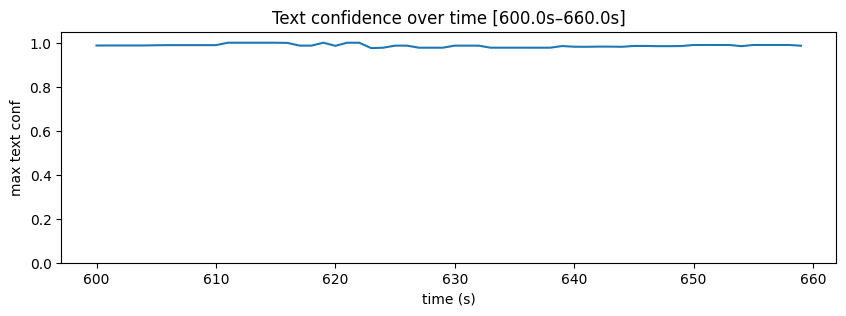

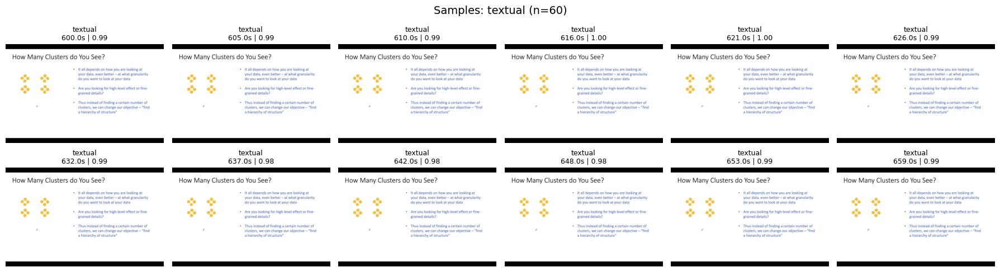

No frames labeled 'non-textual'.


In [ ]:


# ============================================================
# EXAMPLE USAGE
# ============================================================
out = label_video_text_nontext(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=1.0,
    max_candidates=512,
    start_sec=10*60,
    end_sec=11*60,
    languages=["en"],
    conf_thr=0.40,
    min_text_area_frac=0.0005,
    min_chars=2,
    show=True,
)

# out["records"] -> one label per frame
# ============================================================


Video: /content/sample_long.mp4
Segment: [full] | candidates=14 | fps_sample=1.0
EasyOCR langs=['en'] gpu=True
conf_thr=0.4 min_text_area_frac=0.0005 min_chars=2
Textual: 0 | Non-textual: 14


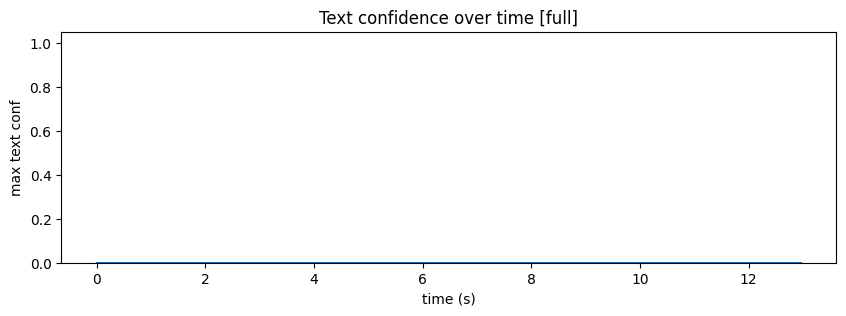

No frames labeled 'textual'.


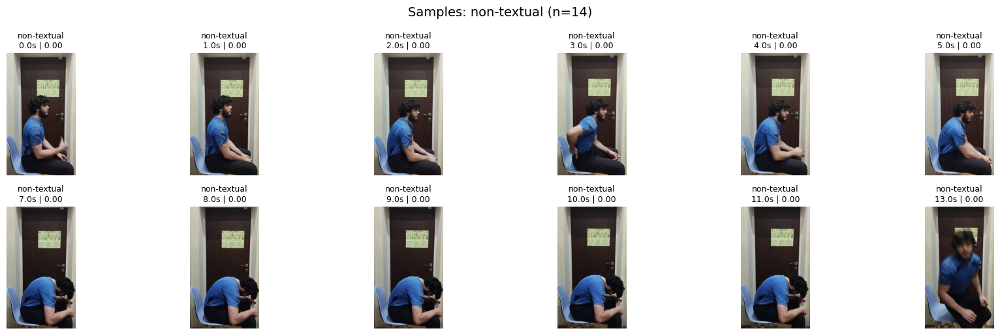

In [ ]:
out = label_video_text_nontext(
    video_path="/content/sample_long.mp4",
    choose_fps=1.0,
    max_candidates=512,
    languages=["en"],     # add "sv" if you want Swedish too: ["en","sv"]
    conf_thr=0.40,
    min_text_area_frac=0.0005,
    min_chars=2,
    show=True,
)


Video: /content/drive/MyDrive/lecture_14_ml.mp4
Segment: [0.0s–60.0s] | candidates=60 | fps_sample=1.0
EasyOCR langs=['en'] gpu=True
conf_thr=0.9 min_text_area_frac=0.001 min_chars=20
Textual: 32 | Non-textual: 28


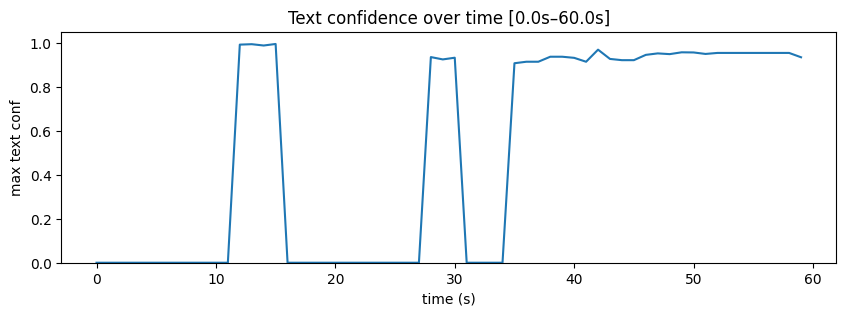

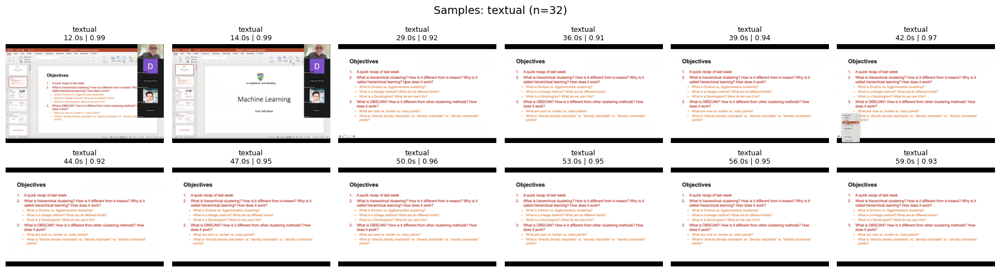

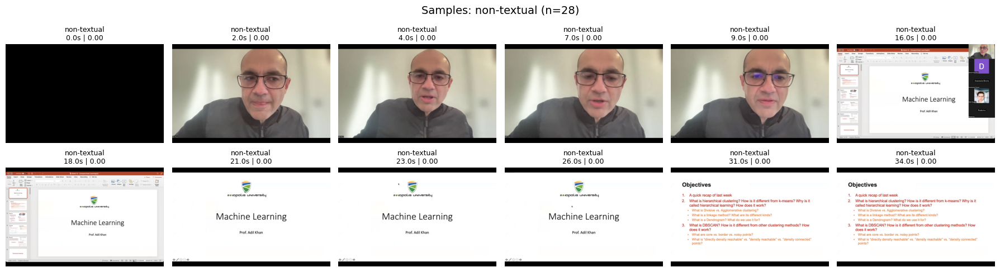

In [ ]:


# ============================================================
# EXAMPLE USAGE
# ============================================================
out = label_video_text_nontext(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=1.0,
    max_candidates=512,
    start_sec=0*60,
    end_sec=1*60,
    languages=["en"],
    conf_thr=0.90,
    min_text_area_frac=0.001,
    min_chars=20,
    show=True,
)

# out["records"] -> one label per frame
# ============================================================


Video: /content/drive/MyDrive/lecture_14_ml.mp4
Segment: [0.0s–60.0s] | candidates=60 | fps_sample=1.0
EasyOCR DETECT-ONLY langs=['en'] gpu=True
min_text_area_frac=0.0005 min_boxes=2 detector_input_size=1024
Textual: 49 | Non-textual: 11


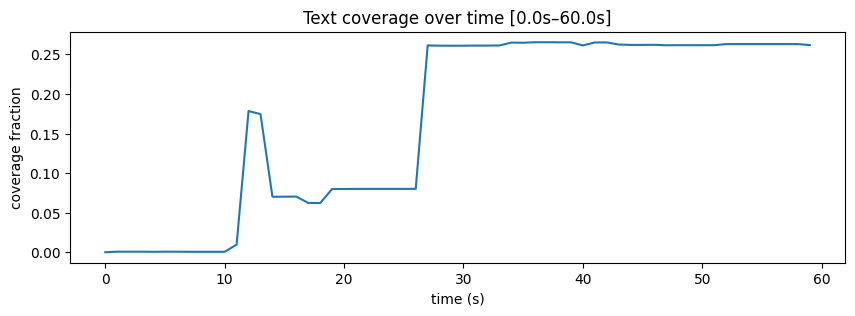

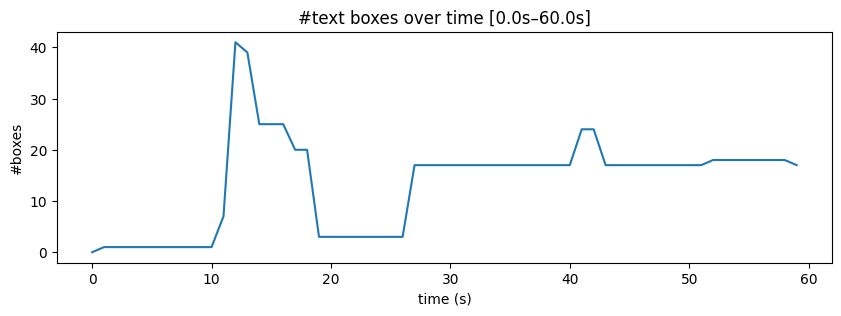

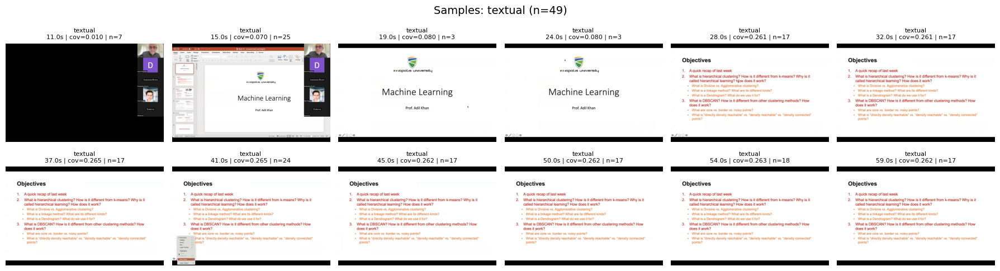

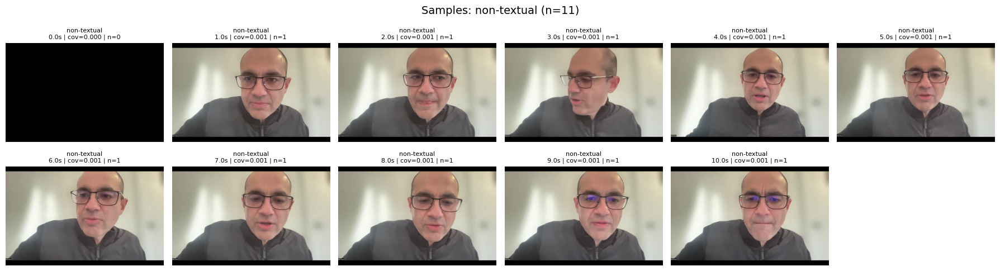

In [ ]:
# ============================================================
# FULLY RUNNABLE: Text detection ONLY (no OCR recognition)
# Labels each frame as "textual" or "non-textual".
#
# Install deps (Colab):
#   !pip -q install decord easyocr opencv-python matplotlib numpy
#
# Why this is good:
# - Uses deep text detector from EasyOCR (CRAFT-based) but skips recognition
# - Robust to "same template, different text" situations
# - Gives you a clean binary label per frame
# ============================================================

import os
import math
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from decord import VideoReader, cpu
import easyocr


# ----------------------------
# 1) Load frames from video (optional subsection)
# ----------------------------
def load_video_segment(
    video_path: str,
    fps_sample: float = 1.0,
    max_candidates: int = 512,
    start_sec: float | None = None,
    end_sec: float | None = None,
    force_sample: bool = True,
):
    """
    Returns:
      frames_rgb: np.ndarray (N, H, W, 3) RGB uint8
      timestamps: list[float] seconds
      orig_frame_idx: list[int] indices in original full video
      segment: (start_sec, end_sec) actually used
      duration: float seconds
      native_fps: float
    """
    if not os.path.exists(video_path):
        raise FileNotFoundError(f"Video not found: {video_path}")

    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    native_fps = float(vr.get_avg_fps())
    total_frames = len(vr)
    duration = total_frames / native_fps

    s = 0.0 if start_sec is None else max(0.0, float(start_sec))
    e = duration if end_sec is None else min(duration, float(end_sec))
    if e <= s:
        raise ValueError(f"Invalid segment: start_sec={s}, end_sec={e}, duration={duration:.2f}")

    start_f = int(round(s * native_fps))
    end_f = int(round(e * native_fps))
    end_f = min(end_f, total_frames)

    step = max(1, int(round(native_fps / float(fps_sample))))
    frame_idx = list(range(start_f, end_f, step))

    if force_sample and len(frame_idx) > int(max_candidates):
        frame_idx = np.linspace(start_f, end_f - 1, int(max_candidates), dtype=int).tolist()

    if len(frame_idx) == 0:
        raise ValueError("No frames selected (segment too small or fps too low).")

    frames_rgb = vr.get_batch(frame_idx).asnumpy()  # RGB uint8
    timestamps = [i / native_fps for i in frame_idx]
    return frames_rgb, timestamps, frame_idx, (s, e), duration, native_fps


# ----------------------------
# 2) EasyOCR detection-only labeling
# ----------------------------
def _poly_area(poly_xy):
    """
    poly_xy: np.ndarray shape (4,2) or list-like of 4 points [[x,y],...]
    returns polygon area
    """
    pts = np.array(poly_xy, dtype=np.float32)
    x = pts[:, 0]
    y = pts[:, 1]
    return float(0.5 * abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1))))

def _boxes_to_polys(horizontal_list, free_list):
    """
    EasyOCR detect() returns:
      horizontal_list: list of boxes, typically [x_min, x_max, y_min, y_max]
      free_list: list of 4-point polygons
    We convert both into a unified list of polygons (4 points).
    """
    polys = []

    # horizontal boxes -> polygon
    for b in horizontal_list:
        # expected: [x_min, x_max, y_min, y_max]
        if b is None or len(b) < 4:
            continue
        x_min, x_max, y_min, y_max = float(b[0]), float(b[1]), float(b[2]), float(b[3])
        poly = np.array([[x_min, y_min], [x_max, y_min], [x_max, y_max], [x_min, y_max]], dtype=np.float32)
        polys.append(poly)

    # free_list already polygon-like
    for p in free_list:
        if p is None:
            continue
        poly = np.array(p, dtype=np.float32)
        if poly.shape[0] == 4 and poly.shape[1] == 2:
            polys.append(poly)

    return polys

def label_frames_text_detection_only(
    frames_rgb: np.ndarray,
    reader: easyocr.Reader,
    min_text_area_frac: float = 0.0005,
    min_boxes: int = 1,
    detector_input_size: int = 1024,
):
    """
    Detect text boxes only (no recognition).
    Label a frame as 'textual' if:
      - number of valid boxes >= min_boxes
      - each valid box has area >= min_text_area_frac * image_area

    Returns:
      labels: np.ndarray of "textual"/"non-textual"
      scores: np.ndarray (float) area_coverage_frac (sum(box_areas)/image_area) capped to [0,1]
      num_boxes: np.ndarray (int) number of valid boxes per frame
      boxes_per_frame: list[list[np.ndarray]] list of polygons per frame (for debugging/visualization)
    """
    H, W = frames_rgb[0].shape[:2]
    img_area = float(H * W)
    min_area = float(min_text_area_frac) * img_area

    labels = []
    scores = []
    num_boxes_arr = []
    boxes_per_frame = []

    for i in range(len(frames_rgb)):
        # EasyOCR expects BGR
        bgr = cv2.cvtColor(frames_rgb[i], cv2.COLOR_RGB2BGR)

        # Detection only: returns (horizontal_list, free_list)
        horizontal_list, free_list = reader.detect(
            bgr,
            text_threshold=0.7,
            low_text=0.4,
            link_threshold=0.4,
            canvas_size=int(detector_input_size),
            mag_ratio=1.0,
        )

        # reader.detect sometimes returns nested lists (batch-style); normalize
        # If it returns list-of-lists, take the first (single image).
        if isinstance(horizontal_list, list) and len(horizontal_list) > 0 and isinstance(horizontal_list[0], list) and len(horizontal_list[0]) > 0 and isinstance(horizontal_list[0][0], (list, tuple, np.ndarray)):
            # ambiguous, but common when detect returns per-image list; handle safely:
            # If this looks like [[boxes...]] and free_list similarly, unwrap.
            # We'll unwrap only if free_list has same structure.
            if isinstance(free_list, list) and len(free_list) > 0 and isinstance(free_list[0], list):
                # if both are per-image lists
                if len(horizontal_list) == 1 and len(free_list) == 1:
                    horizontal_list = horizontal_list[0]
                    free_list = free_list[0]

        polys = _boxes_to_polys(horizontal_list, free_list)

        valid_polys = []
        total_area = 0.0
        for poly in polys:
            area = _poly_area(poly)
            if area >= min_area:
                valid_polys.append(poly)
                total_area += area

        n_valid = len(valid_polys)
        coverage = min(1.0, total_area / img_area)

        is_text = n_valid >= int(min_boxes)
        labels.append("textual" if is_text else "non-textual")
        scores.append(float(coverage))
        num_boxes_arr.append(int(n_valid))
        boxes_per_frame.append(valid_polys)

    return (
        np.array(labels),
        np.array(scores, dtype=np.float32),
        np.array(num_boxes_arr, dtype=np.int32),
        boxes_per_frame
    )


# ----------------------------
# 3) Visualization
# ----------------------------
def plot_timeline(timestamps, values, title, ylabel):
    plt.figure(figsize=(10, 3))
    plt.plot(timestamps, values)
    plt.xlabel("time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()

def show_samples(frames_rgb, timestamps, labels, scores, num_boxes, which="textual", k=12, cols=6):
    idx = np.where(labels == which)[0]
    if len(idx) == 0:
        print(f"No frames labeled '{which}'.")
        return

    take = idx if len(idx) <= k else idx[np.linspace(0, len(idx) - 1, k, dtype=int)]
    rows = int(math.ceil(len(take) / cols))

    plt.figure(figsize=(cols * 3.0, rows * 2.6))
    for j, i in enumerate(take):
        ax = plt.subplot(rows, cols, j + 1)
        ax.imshow(frames_rgb[i])
        ax.set_title(f"{which}\n{timestamps[i]:.1f}s | cov={scores[i]:.3f} | n={num_boxes[i]}", fontsize=8)
        ax.axis("off")
    plt.suptitle(f"Samples: {which} (n={len(idx)})", fontsize=14)
    plt.tight_layout()
    plt.show()


# ----------------------------
# 4) End-to-end runner
# ----------------------------
def label_video_text_nontext_detection_only(
    video_path: str,
    choose_fps: float = 1.0,
    max_candidates: int = 512,
    start_sec: float | None = None,
    end_sec: float | None = None,
    languages: list[str] | None = None,
    min_text_area_frac: float = 0.0005,
    min_boxes: int = 1,
    detector_input_size: int = 1024,
    show: bool = True,
):
    """
    Returns:
      records: list of dicts with one label per frame
      plus frames/timestamps for debugging
    """
    frames, timestamps, orig_frame_idx, segment, duration, native_fps = load_video_segment(
        video_path=video_path,
        fps_sample=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        force_sample=True,
    )

    use_gpu = torch.cuda.is_available()
    langs = ["en"] if languages is None else languages

    # IMPORTANT: Reader init downloads weights on first run
    reader = easyocr.Reader(langs, gpu=use_gpu)

    labels, coverage_scores, num_boxes, boxes_per_frame = label_frames_text_detection_only(
        frames_rgb=frames,
        reader=reader,
        min_text_area_frac=min_text_area_frac,
        min_boxes=min_boxes,
        detector_input_size=detector_input_size,
    )

    records = []
    for i in range(len(frames)):
        records.append({
            "candidate_i": int(i),
            "orig_frame_idx": int(orig_frame_idx[i]),
            "timestamp_sec": float(timestamps[i]),
            "label": str(labels[i]),
            "text_coverage": float(coverage_scores[i]),
            "num_text_boxes": int(num_boxes[i]),
        })

    if show:
        seg_label = f"[{segment[0]:.1f}s–{segment[1]:.1f}s]" if (start_sec is not None or end_sec is not None) else "[full]"
        print(f"Video: {video_path}")
        print(f"Segment: {seg_label} | candidates={len(frames)} | fps_sample={choose_fps}")
        print(f"EasyOCR DETECT-ONLY langs={langs} gpu={use_gpu}")
        print(f"min_text_area_frac={min_text_area_frac} min_boxes={min_boxes} detector_input_size={detector_input_size}")
        print(f"Textual: {(labels=='textual').sum()} | Non-textual: {(labels=='non-textual').sum()}")

        plot_timeline(timestamps, coverage_scores, title=f"Text coverage over time {seg_label}", ylabel="coverage fraction")
        plot_timeline(timestamps, num_boxes, title=f"#text boxes over time {seg_label}", ylabel="#boxes")
        show_samples(frames, timestamps, labels, coverage_scores, num_boxes, which="textual", k=12)
        show_samples(frames, timestamps, labels, coverage_scores, num_boxes, which="non-textual", k=12)

    return {
        "video_path": video_path,
        "segment": {"start_sec": segment[0], "end_sec": segment[1], "duration_sec": duration, "native_fps": native_fps},
        "params": {
            "choose_fps": choose_fps,
            "max_candidates": max_candidates,
            "languages": langs,
            "min_text_area_frac": min_text_area_frac,
            "min_boxes": min_boxes,
            "detector_input_size": detector_input_size,
        },
        "frames": frames,
        "timestamps": timestamps,
        "orig_frame_idx": orig_frame_idx,
        "labels": labels,
        "text_coverage": coverage_scores,
        "num_text_boxes": num_boxes,
        "boxes_per_frame": boxes_per_frame,  # polygons for debugging if needed
        "records": records,                  # <- this is your per-frame label list
    }


# ============================================================
# Example usage
# ============================================================
out = label_video_text_nontext_detection_only(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=1.0,
    max_candidates=512,
    start_sec=0*60,
    end_sec=1*60,
    languages=["en"],          # add "sv" if needed: ["en","sv"]
    min_text_area_frac=0.0005, # lower if you want to catch small subtitles (e.g. 0.0002)
    min_boxes=2,
    detector_input_size=1024,
    show=True,
)
#
# out["records"] -> one label per frame
# ============================================================


# MaxInfo + text identification

In [ ]:
!pip install decord easyocr opencv-python matplotlib numpy scipy transformers accelerate


In [ ]:
# ============================================================
# FULLY RUNNABLE: Segment + Chunked MaxInfo + Text-detect + SlideGuard
# - Segment: start_sec/end_sec
# - Chunking: chunk_seconds OR num_chunks (choose one)
# - MaxInfo per chunk (SVD + pivoted QR) + slide-guard similarity filtering
# ============================================================

import os, math
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

from decord import VideoReader, cpu
from scipy.spatial.distance import cosine
from scipy.linalg import qr

import easyocr
from transformers import AutoProcessor, CLIPModel


# -----------------------------
# 1) Video loading (segment)
# -----------------------------
def load_video_segment(
    video_path: str,
    fps_sample: float = 1.0,
    max_candidates: int = 256,
    start_sec: float | None = None,
    end_sec: float | None = None,
    force_sample: bool = True,
):
    if not os.path.exists(video_path):
        raise FileNotFoundError(f"Video not found: {video_path}")

    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    native_fps = float(vr.get_avg_fps())
    total_frames = len(vr)
    duration = total_frames / native_fps

    s = 0.0 if start_sec is None else max(0.0, float(start_sec))
    e = duration if end_sec is None else min(duration, float(end_sec))
    if e <= s:
        raise ValueError(f"Invalid segment: start_sec={s}, end_sec={e}, duration={duration:.2f}")

    start_f = int(round(s * native_fps))
    end_f = int(round(e * native_fps))
    end_f = min(end_f, total_frames)

    step = max(1, int(round(native_fps / float(fps_sample))))
    frame_idx = list(range(start_f, end_f, step))

    if force_sample and len(frame_idx) > int(max_candidates):
        frame_idx = np.linspace(start_f, end_f - 1, int(max_candidates), dtype=int).tolist()

    if len(frame_idx) == 0:
        raise ValueError("No frames selected (segment too small or fps too low).")

    frames = vr.get_batch(frame_idx).asnumpy()  # RGB uint8 (T,H,W,3)
    timestamps = [i / native_fps for i in frame_idx]
    return frames, timestamps, frame_idx, (s, e), duration, native_fps


# -----------------------------
# 2) CLIP features (batched)
# -----------------------------
@torch.no_grad()
def extract_clip_features(vision_model, vision_processor, frames_np, batch_size=16):
    device = vision_model.device
    feats_all = []
    for i in range(0, len(frames_np), batch_size):
        batch = [frames_np[j] for j in range(i, min(i + batch_size, len(frames_np)))]
        inputs = vision_processor(images=batch, return_tensors="pt", padding=True)
        inputs = {k: v.to(device) for k, v in inputs.items() if torch.is_tensor(v)}
        out = vision_model.vision_model(pixel_values=inputs["pixel_values"])
        pooled = out.pooler_output
        feats = vision_model.visual_projection(pooled)
        feats = torch.nn.functional.normalize(feats, dim=-1)
        feats_all.append(feats.float().cpu())
    return torch.cat(feats_all, dim=0).numpy()  # (T, D)


# -----------------------------
# 3) MaxInfo-ish selection: SVD + pivoted QR
# -----------------------------
def svd_reduce_dim(features: np.ndarray, r: int = 8) -> np.ndarray:
    U, S, Vt = np.linalg.svd(features, full_matrices=False)
    return U[:, :r]

def select_rows_pivoted_qr(matrix: np.ndarray, k: int) -> list[int]:
    k = int(max(1, min(k, matrix.shape[0])))
    _, _, piv = qr(matrix.T, pivoting=True, mode="economic")
    return list(map(int, piv[:k]))


# -----------------------------
# 4) Text detection ONLY (EasyOCR detect)
# -----------------------------
def _poly_area(poly_xy):
    pts = np.array(poly_xy, dtype=np.float32)
    x = pts[:, 0]
    y = pts[:, 1]
    return float(0.5 * abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1))))

def _boxes_to_polys(horizontal_list, free_list):
    polys = []
    for b in horizontal_list:
        if b is None or len(b) < 4:
            continue
        x_min, x_max, y_min, y_max = float(b[0]), float(b[1]), float(b[2]), float(b[3])
        poly = np.array([[x_min, y_min], [x_max, y_min], [x_max, y_max], [x_min, y_max]], dtype=np.float32)
        polys.append(poly)
    for p in free_list:
        if p is None:
            continue
        poly = np.array(p, dtype=np.float32)
        if poly.shape == (4, 2):
            polys.append(poly)
    return polys

def detect_textual_frames(
    frames_np: np.ndarray,
    reader: easyocr.Reader,
    min_text_area_frac: float = 0.0005,
    min_boxes: int = 1,
    detector_input_size: int = 1024,
):
    H, W = frames_np[0].shape[:2]
    img_area = float(H * W)
    min_area = float(min_text_area_frac) * img_area

    is_text = np.zeros((len(frames_np),), dtype=bool)
    num_boxes = np.zeros((len(frames_np),), dtype=np.int32)
    coverage = np.zeros((len(frames_np),), dtype=np.float32)

    for i in range(len(frames_np)):
        bgr = cv2.cvtColor(frames_np[i], cv2.COLOR_RGB2BGR)

        horizontal_list, free_list = reader.detect(
            bgr,
            text_threshold=0.7,
            low_text=0.4,
            link_threshold=0.4,
            canvas_size=int(detector_input_size),
            mag_ratio=1.0,
        )

        # unwrap common "per-image list" return format
        if isinstance(horizontal_list, list) and len(horizontal_list) == 1 and isinstance(horizontal_list[0], list):
            horizontal_list = horizontal_list[0]
        if isinstance(free_list, list) and len(free_list) == 1 and isinstance(free_list[0], list):
            free_list = free_list[0]

        polys = _boxes_to_polys(horizontal_list, free_list)

        total_area = 0.0
        valid = 0
        for poly in polys:
            a = _poly_area(poly)
            if a >= min_area:
                valid += 1
                total_area += a

        num_boxes[i] = valid
        coverage[i] = min(1.0, total_area / img_area)
        is_text[i] = valid >= int(min_boxes)

    return is_text, num_boxes, coverage


# -----------------------------
# 5) Slide change guard (pixel change) for textual frames
# -----------------------------
def pixel_change_rate(frame_a: np.ndarray, frame_b: np.ndarray, down=(160, 90)) -> float:
    a = cv2.cvtColor(frame_a, cv2.COLOR_RGB2GRAY)
    b = cv2.cvtColor(frame_b, cv2.COLOR_RGB2GRAY)
    a = cv2.resize(a, down, interpolation=cv2.INTER_AREA)
    b = cv2.resize(b, down, interpolation=cv2.INTER_AREA)
    return float(np.mean(np.abs(a.astype(np.float32) - b.astype(np.float32))) / 255.0)

def filter_similar_with_slide_guard(
    frames_np: np.ndarray,
    feats: np.ndarray,
    selected_sorted: list[int],
    is_text: np.ndarray,
    sim_thr: float = 0.90,
    slide_eps: float = 0.06,
    down=(160, 90),
):
    if not selected_sorted:
        return []

    kept = [selected_sorted[0]]
    for idx in selected_sorted[1:]:
        last = kept[-1]
        sim = 1.0 - cosine(feats[last], feats[idx])

        if sim < sim_thr:
            kept.append(idx)
            continue

        # high similarity -> decide with slide guard only if both are textual
        if bool(is_text[last]) and bool(is_text[idx]):
            chg = pixel_change_rate(frames_np[last], frames_np[idx], down=down)
            if chg > slide_eps:
                kept.append(idx)
            # else drop
        # else drop (redundant non-text)
    return kept


# -----------------------------
# 6) Chunking helpers
# -----------------------------
def make_chunks_by_seconds(
    timestamps: list[float],
    chunk_seconds: float,
):
    """
    Returns list of (start_idx, end_idx) in candidate index space, contiguous,
    partitioned by time. End is exclusive.
    """
    if chunk_seconds <= 0:
        raise ValueError("chunk_seconds must be > 0")

    ts = np.array(timestamps, dtype=np.float32)
    chunks = []
    start = 0
    while start < len(ts):
        t0 = ts[start]
        end = start
        while end < len(ts) and (ts[end] - t0) < chunk_seconds:
            end += 1
        chunks.append((start, end))
        start = end
    return chunks

def make_chunks_by_count(num_items: int, num_chunks: int):
    if num_chunks <= 0:
        raise ValueError("num_chunks must be > 0")
    edges = np.linspace(0, num_items, num_chunks + 1).astype(int)
    chunks = []
    for i in range(num_chunks):
        a, b = int(edges[i]), int(edges[i + 1])
        if b > a:
            chunks.append((a, b))
    return chunks

def allocate_budget(total_budget: int, n_chunks: int):
    """
    Even allocation + remainder distribution.
    """
    if n_chunks <= 0:
        return []
    base = total_budget // n_chunks
    rem = total_budget % n_chunks
    alloc = [base + (1 if i < rem else 0) for i in range(n_chunks)]
    return alloc


# -----------------------------
# 7) Chunked MaxInfo selection
# -----------------------------
def maxinfo_select_chunked(
    vision_model,
    vision_processor,
    frames_np: np.ndarray,
    timestamps: list[float],
    is_text: np.ndarray,
    budget: int = 32,
    svd_rank: int = 8,
    batch_size: int = 16,
    remove_similar: bool = True,
    similarity_thr: float = 0.90,
    slide_eps: float = 0.06,
    slide_down=(160, 90),
    chunk_seconds: float | None = None,
    num_chunks: int | None = None,
):
    """
    Chunk the candidate list then run MaxInfo within each chunk.

    You must specify exactly one of:
      - chunk_seconds
      - num_chunks
    """
    if (chunk_seconds is None) == (num_chunks is None):
        raise ValueError("Specify exactly one of chunk_seconds or num_chunks")

    T = len(frames_np)
    if T == 0:
        return np.array([], dtype=int).tolist()

    # precompute CLIP features once for all candidates (faster + consistent)
    feats = extract_clip_features(vision_model, vision_processor, frames_np, batch_size=batch_size)

    # make chunks
    if chunk_seconds is not None:
        chunks = make_chunks_by_seconds(timestamps, float(chunk_seconds))
    else:
        chunks = make_chunks_by_count(T, int(num_chunks))

    # allocate budget over chunks, but cap per-chunk by chunk size
    alloc = allocate_budget(int(budget), len(chunks))

    selected_global = []

    for (k, (a, b)) in enumerate(chunks):
        chunk_len = b - a
        if chunk_len <= 0:
            continue

        k_budget = min(int(alloc[k]), chunk_len)
        if k_budget <= 0:
            continue

        # select within chunk using SVD+QR on the chunk features
        low = svd_reduce_dim(feats[a:b], r=min(int(svd_rank), chunk_len))
        local_idx = select_rows_pivoted_qr(low, k=k_budget)
        local_idx = sorted(local_idx)
        # map back to global candidate indices
        idx = [a + j for j in local_idx]
        idx = sorted(idx)

        if remove_similar and len(idx) > 1:
            idx = filter_similar_with_slide_guard(
                frames_np=frames_np,
                feats=feats,
                selected_sorted=idx,
                is_text=is_text,
                sim_thr=float(similarity_thr),
                slide_eps=float(slide_eps),
                down=slide_down,
            )

        selected_global.extend(idx)

    # final unique + sorted
    selected_global = sorted(set(selected_global))
    return selected_global


# -----------------------------
# 8) Baseline + visualization
# -----------------------------
def uniform_select(frames_np, timestamps, budget: int = 32):
    T = len(frames_np)
    k = min(int(budget), T)
    idx = np.linspace(0, T - 1, k).astype(int).tolist()
    return idx

def show_grid(frames_np, idx, title, cols=8):
    n = len(idx)
    rows = math.ceil(n / cols)
    plt.figure(figsize=(cols * 2.25, rows * 2.25))
    for i, j in enumerate(idx, start=1):
        ax = plt.subplot(rows, cols, i)
        ax.imshow(frames_np[j])
        ax.set_title(f"cand={j}", fontsize=9)
        ax.axis("off")
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

def show_timeline(uniform_idx, maxinfo_idx, total_candidates, title="Selection timeline"):
    u = np.array(uniform_idx, dtype=int)
    m = np.array(maxinfo_idx, dtype=int)
    plt.figure(figsize=(14, 2.4))
    plt.scatter(u, np.zeros_like(u), label="Uniform", alpha=0.85)
    plt.scatter(m, np.ones_like(m), label="MaxInfo-chunked", alpha=0.85)
    plt.yticks([0, 1], ["Uniform", "MaxInfo"])
    plt.xlim(0, max(0, total_candidates - 1))
    plt.xlabel("Candidate frame index")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()


# -----------------------------
# 9) End-to-end compare (Segment + Chunking)
# -----------------------------
def compare_sampling_on_video_chunked(
    video_path: str,

    # segment
    start_sec: float | None = None,
    end_sec: float | None = None,

    # candidate sampling
    choose_fps: float = 1.0,
    max_candidates: int = 512,

    # selection
    budget: int = 16,
    svd_rank: int = 8,
    batch_size: int = 16,

    # redundancy removal + slide guard
    remove_similar: bool = True,
    similarity_thr: float = 0.92,
    slide_eps: float = 0.06,
    slide_down=(160, 90),

    # chunking (specify ONE)
    chunk_seconds: float | None = 120.0,  # e.g., 2-minute chunks
    num_chunks: int | None = None,

    # text detection
    languages: list[str] | None = None,
    min_text_area_frac: float = 0.0005,
    min_boxes: int = 2,
    detector_input_size: int = 1024,

    # viz
    show: bool = True,
):
    # candidates from segment
    frames_np, timestamps, orig_frame_idx, seg, duration, native_fps = load_video_segment(
        video_path=video_path,
        fps_sample=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        force_sample=True,
    )

    # models
    clip_name = "openai/clip-vit-large-patch14-336"
    vision_model = CLIPModel.from_pretrained(clip_name, device_map="auto").eval()
    vision_processor = AutoProcessor.from_pretrained(clip_name)

    use_gpu = torch.cuda.is_available()
    langs = ["en"] if languages is None else languages
    reader = easyocr.Reader(langs, gpu=use_gpu)

    # text detection (per candidate frame)
    is_text, num_text_boxes, text_coverage = detect_textual_frames(
        frames_np=frames_np,
        reader=reader,
        min_text_area_frac=min_text_area_frac,
        min_boxes=min_boxes,
        detector_input_size=detector_input_size,
    )

    # uniform baseline indices
    uni_idx = uniform_select(frames_np, timestamps, budget=budget)

    # chunked maxinfo indices
    mi_idx = maxinfo_select_chunked(
        vision_model=vision_model,
        vision_processor=vision_processor,
        frames_np=frames_np,
        timestamps=timestamps,
        is_text=is_text,
        budget=budget,
        svd_rank=svd_rank,
        batch_size=batch_size,
        remove_similar=remove_similar,
        similarity_thr=similarity_thr,
        slide_eps=slide_eps,
        slide_down=slide_down,
        chunk_seconds=chunk_seconds,
        num_chunks=num_chunks,
    )

    if show:
        seg_label = f"[{seg[0]:.1f}s–{seg[1]:.1f}s]"
        chunk_label = f"chunk_seconds={chunk_seconds}" if chunk_seconds is not None else f"num_chunks={num_chunks}"
        print(f"Video: {video_path}")
        print(f"Segment: {seg_label} | candidates={len(frames_np)} | choose_fps={choose_fps}")
        print(f"Textual candidates: {int(is_text.sum())}/{len(is_text)}")
        print(f"Chunking: {chunk_label} | budget={budget}")
        print(f"RemoveSimilar: {remove_similar} sim_thr={similarity_thr} slide_eps={slide_eps}")

        show_grid(frames_np, uni_idx, title=f"Uniform (budget={budget}) {seg_label}", cols=8)
        show_grid(frames_np, mi_idx, title=f"MaxInfo-Chunked+SlideGuard (budget={budget}) {seg_label}", cols=8)
        show_timeline(uni_idx, mi_idx, total_candidates=len(frames_np), title=f"Uniform vs MaxInfo-Chunked {seg_label}")

    # per-frame records
    records = []
    for i in range(len(frames_np)):
        records.append({
            "candidate_i": int(i),
            "timestamp_sec": float(timestamps[i]),
            "orig_frame_idx": int(orig_frame_idx[i]),
            "is_text": bool(is_text[i]),
            "num_text_boxes": int(num_text_boxes[i]),
            "text_coverage": float(text_coverage[i]),
        })

    return {
        "video_path": video_path,
        "segment": {"start_sec": seg[0], "end_sec": seg[1], "duration_sec": duration, "native_fps": native_fps},
        "params": {
            "choose_fps": choose_fps,
            "max_candidates": max_candidates,
            "budget": budget,
            "svd_rank": svd_rank,
            "batch_size": batch_size,
            "remove_similar": remove_similar,
            "similarity_thr": similarity_thr,
            "slide_eps": slide_eps,
            "slide_down": slide_down,
            "chunk_seconds": chunk_seconds,
            "num_chunks": num_chunks,
            "text_detect": {
                "languages": langs,
                "min_text_area_frac": min_text_area_frac,
                "min_boxes": min_boxes,
                "detector_input_size": detector_input_size,
            },
        },
        "candidates": {
            "frames": frames_np,
            "timestamps": timestamps,
            "orig_frame_idx": orig_frame_idx,
            "records": records,
        },
        "uniform": {"indices": uni_idx, "timestamps": [timestamps[i] for i in uni_idx]},
        "maxinfo_chunked_slideguard": {"indices": mi_idx, "timestamps": [timestamps[i] for i in mi_idx]},
    }



/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/590 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

CLIPModel LOAD REPORT from: openai/clip-vit-large-patch14-336
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/844 [00:00<?, ?B/s]

The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Video: /content/drive/MyDrive/lecture_14_ml.mp4
Segment: [0.0s–60.0s] | candidates=60 | choose_fps=1.0
Textual candidates: 49/60
Chunking: chunk_seconds=120.0 | budget=32
RemoveSimilar: True sim_thr=0.92 slide_eps=0.06


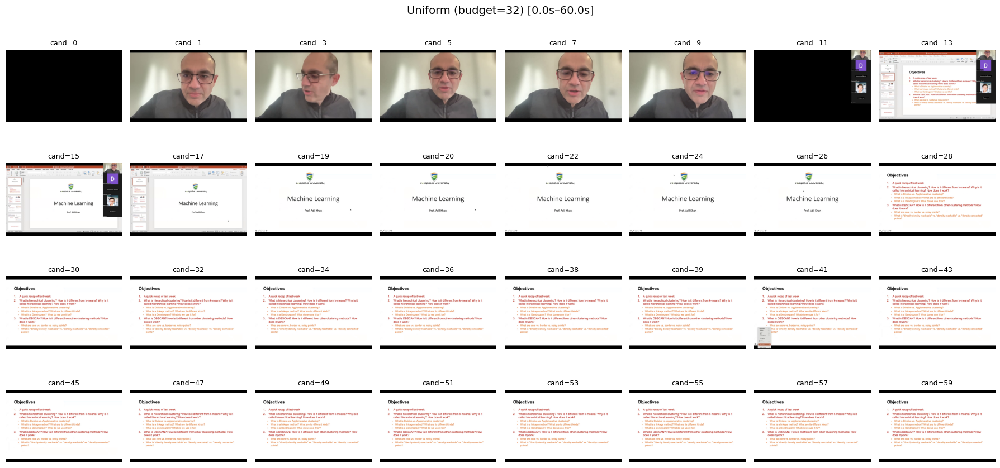

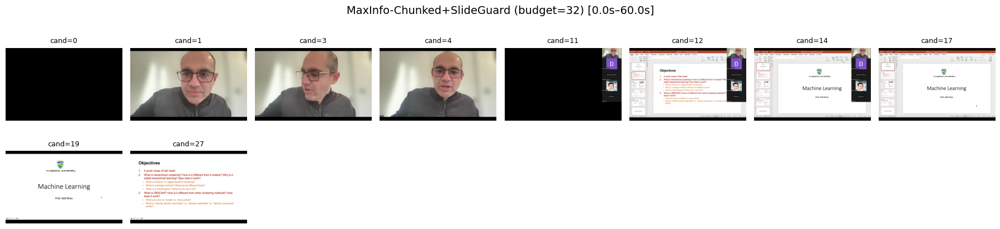

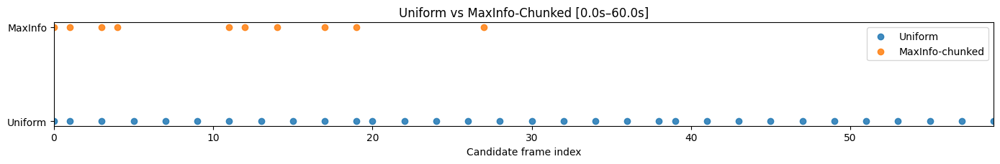

In [ ]:

# ============================================================
# Example usage
# ============================================================
out = compare_sampling_on_video_chunked(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    start_sec=0*60,
    end_sec=1*60,
    choose_fps=1.0,
    max_candidates=512,
    budget=32,
    svd_rank=8,
    batch_size=16,
    remove_similar=True,
    similarity_thr=0.92,
    slide_eps=0.06,
    chunk_seconds=120.0,   # 2-min chunks inside the segment
    num_chunks=None,       # keep None if chunk_seconds is used
    languages=["en"],
    show=True,
)


In [ ]:
# ============================================================
# FULLY RUNNABLE: Compare
#  (1) Uniform
#  (2) Normal MaxInfo (no text)
#  (3) Chunked MaxInfo + TextDetect + SlideGuard
# On the same segment/candidate pool.
# ============================================================

import os, math
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

from decord import VideoReader, cpu
from scipy.spatial.distance import cosine
from scipy.linalg import qr

import easyocr
from transformers import AutoProcessor, CLIPModel


# -----------------------------
# 1) Load candidates from segment
# -----------------------------
def load_video_segment(
    video_path: str,
    fps_sample: float = 1.0,
    max_candidates: int = 256,
    start_sec: float | None = None,
    end_sec: float | None = None,
    force_sample: bool = True,
):
    if not os.path.exists(video_path):
        raise FileNotFoundError(f"Video not found: {video_path}")

    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    native_fps = float(vr.get_avg_fps())
    total_frames = len(vr)
    duration = total_frames / native_fps

    s = 0.0 if start_sec is None else max(0.0, float(start_sec))
    e = duration if end_sec is None else min(duration, float(end_sec))
    if e <= s:
        raise ValueError(f"Invalid segment: start_sec={s}, end_sec={e}, duration={duration:.2f}")

    start_f = int(round(s * native_fps))
    end_f = int(round(e * native_fps))
    end_f = min(end_f, total_frames)

    step = max(1, int(round(native_fps / float(fps_sample))))
    frame_idx = list(range(start_f, end_f, step))

    if force_sample and len(frame_idx) > int(max_candidates):
        frame_idx = np.linspace(start_f, end_f - 1, int(max_candidates), dtype=int).tolist()

    if len(frame_idx) == 0:
        raise ValueError("No frames selected (segment too small or fps too low).")

    frames = vr.get_batch(frame_idx).asnumpy()  # RGB uint8 (T,H,W,3)
    timestamps = [i / native_fps for i in frame_idx]
    return frames, timestamps, frame_idx, (s, e), duration, native_fps


# -----------------------------
# 2) CLIP features (computed once)
# -----------------------------
@torch.no_grad()
def extract_clip_features(vision_model, vision_processor, frames_np, batch_size=16):
    device = vision_model.device
    feats_all = []
    for i in range(0, len(frames_np), batch_size):
        batch = [frames_np[j] for j in range(i, min(i + batch_size, len(frames_np)))]
        inputs = vision_processor(images=batch, return_tensors="pt", padding=True)
        inputs = {k: v.to(device) for k, v in inputs.items() if torch.is_tensor(v)}
        out = vision_model.vision_model(pixel_values=inputs["pixel_values"])
        pooled = out.pooler_output
        feats = vision_model.visual_projection(pooled)
        feats = torch.nn.functional.normalize(feats, dim=-1)
        feats_all.append(feats.float().cpu())
    return torch.cat(feats_all, dim=0).numpy()  # (T, D)


# -----------------------------
# 3) MaxInfo core: SVD + pivoted QR
# -----------------------------
def svd_reduce_dim(features: np.ndarray, r: int = 8) -> np.ndarray:
    U, S, Vt = np.linalg.svd(features, full_matrices=False)
    return U[:, :r]

def select_rows_pivoted_qr(matrix: np.ndarray, k: int) -> list[int]:
    k = int(max(1, min(k, matrix.shape[0])))
    _, _, piv = qr(matrix.T, pivoting=True, mode="economic")
    return list(map(int, piv[:k]))

def filter_similar_clip_only(feats: np.ndarray, selected_sorted: list[int], sim_thr: float = 0.92):
    """
    Normal "remove_similar": drop frame if it's too similar to last kept in CLIP space.
    """
    if not selected_sorted:
        return []
    kept = [selected_sorted[0]]
    for idx in selected_sorted[1:]:
        last = kept[-1]
        sim = 1.0 - cosine(feats[last], feats[idx])
        if sim < sim_thr:
            kept.append(idx)
    return kept

def maxinfo_normal(
    feats: np.ndarray,
    budget: int = 32,
    svd_rank: int = 8,
    remove_similar: bool = True,
    similarity_thr: float = 0.92,
):
    T = feats.shape[0]
    k = min(int(budget), T)
    low = svd_reduce_dim(feats, r=min(int(svd_rank), T))
    idx = sorted(select_rows_pivoted_qr(low, k=k))
    if remove_similar and len(idx) > 1:
        idx = filter_similar_clip_only(feats, idx, sim_thr=float(similarity_thr))
    return idx


# -----------------------------
# 4) Text detection ONLY (EasyOCR detect)
# -----------------------------
def _poly_area(poly_xy):
    pts = np.array(poly_xy, dtype=np.float32)
    x = pts[:, 0]
    y = pts[:, 1]
    return float(0.5 * abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1))))

def _boxes_to_polys(horizontal_list, free_list):
    polys = []
    for b in horizontal_list:
        if b is None or len(b) < 4:
            continue
        x_min, x_max, y_min, y_max = float(b[0]), float(b[1]), float(b[2]), float(b[3])
        poly = np.array([[x_min, y_min], [x_max, y_min], [x_max, y_max], [x_min, y_max]], dtype=np.float32)
        polys.append(poly)
    for p in free_list:
        if p is None:
            continue
        poly = np.array(p, dtype=np.float32)
        if poly.shape == (4, 2):
            polys.append(poly)
    return polys

def detect_textual_frames(
    frames_np: np.ndarray,
    reader: easyocr.Reader,
    min_text_area_frac: float = 0.0005,
    min_boxes: int = 1,
    detector_input_size: int = 1024,
):
    H, W = frames_np[0].shape[:2]
    img_area = float(H * W)
    min_area = float(min_text_area_frac) * img_area

    is_text = np.zeros((len(frames_np),), dtype=bool)
    num_boxes = np.zeros((len(frames_np),), dtype=np.int32)
    coverage = np.zeros((len(frames_np),), dtype=np.float32)

    for i in range(len(frames_np)):
        bgr = cv2.cvtColor(frames_np[i], cv2.COLOR_RGB2BGR)
        horizontal_list, free_list = reader.detect(
            bgr,
            text_threshold=0.7,
            low_text=0.4,
            link_threshold=0.4,
            canvas_size=int(detector_input_size),
            mag_ratio=1.0,
        )

        # unwrap common per-image list format
        if isinstance(horizontal_list, list) and len(horizontal_list) == 1 and isinstance(horizontal_list[0], list):
            horizontal_list = horizontal_list[0]
        if isinstance(free_list, list) and len(free_list) == 1 and isinstance(free_list[0], list):
            free_list = free_list[0]

        polys = _boxes_to_polys(horizontal_list, free_list)

        total_area = 0.0
        valid = 0
        for poly in polys:
            a = _poly_area(poly)
            if a >= min_area:
                valid += 1
                total_area += a

        num_boxes[i] = valid
        coverage[i] = min(1.0, total_area / img_area)
        is_text[i] = valid >= int(min_boxes)

    return is_text, num_boxes, coverage


# -----------------------------
# 5) SlideGuard: pixel change for TEXT frames
# -----------------------------
def pixel_change_rate(frame_a: np.ndarray, frame_b: np.ndarray, down=(160, 90)) -> float:
    a = cv2.cvtColor(frame_a, cv2.COLOR_RGB2GRAY)
    b = cv2.cvtColor(frame_b, cv2.COLOR_RGB2GRAY)
    a = cv2.resize(a, down, interpolation=cv2.INTER_AREA)
    b = cv2.resize(b, down, interpolation=cv2.INTER_AREA)
    return float(np.mean(np.abs(a.astype(np.float32) - b.astype(np.float32))) / 255.0)

def filter_similar_with_slide_guard(
    frames_np: np.ndarray,
    feats: np.ndarray,
    selected_sorted: list[int],
    is_text: np.ndarray,
    sim_thr: float = 0.92,
    slide_eps: float = 0.06,
    down=(160, 90),
):
    """
    If CLIP sim is high, we'd drop — BUT if both textual and pixel-change>eps => keep.
    """
    if not selected_sorted:
        return []

    kept = [selected_sorted[0]]
    for idx in selected_sorted[1:]:
        last = kept[-1]
        sim = 1.0 - cosine(feats[last], feats[idx])

        if sim < sim_thr:
            kept.append(idx)
            continue

        # high similarity -> slide guard if both textual
        if bool(is_text[last]) and bool(is_text[idx]):
            chg = pixel_change_rate(frames_np[last], frames_np[idx], down=down)
            if chg > slide_eps:
                kept.append(idx)
    return kept


# -----------------------------
# 6) Chunking + chunked maxinfo
# -----------------------------
def make_chunks_by_seconds(timestamps: list[float], chunk_seconds: float):
    if chunk_seconds <= 0:
        raise ValueError("chunk_seconds must be > 0")
    ts = np.array(timestamps, dtype=np.float32)
    chunks = []
    start = 0
    while start < len(ts):
        t0 = ts[start]
        end = start
        while end < len(ts) and (ts[end] - t0) < chunk_seconds:
            end += 1
        chunks.append((start, end))
        start = end
    return chunks

def make_chunks_by_count(num_items: int, num_chunks: int):
    if num_chunks <= 0:
        raise ValueError("num_chunks must be > 0")
    edges = np.linspace(0, num_items, num_chunks + 1).astype(int)
    chunks = []
    for i in range(num_chunks):
        a, b = int(edges[i]), int(edges[i + 1])
        if b > a:
            chunks.append((a, b))
    return chunks

def allocate_budget(total_budget: int, n_chunks: int):
    if n_chunks <= 0:
        return []
    base = total_budget // n_chunks
    rem = total_budget % n_chunks
    return [base + (1 if i < rem else 0) for i in range(n_chunks)]

def maxinfo_chunked_text_slideguard(
    frames_np: np.ndarray,
    timestamps: list[float],
    feats: np.ndarray,
    is_text: np.ndarray,
    budget: int = 32,
    svd_rank: int = 8,
    remove_similar: bool = True,
    similarity_thr: float = 0.92,
    slide_eps: float = 0.06,
    slide_down=(160, 90),
    chunk_seconds: float | None = 120.0,
    num_chunks: int | None = None,
):
    if (chunk_seconds is None) == (num_chunks is None):
        raise ValueError("Specify exactly one of chunk_seconds or num_chunks")

    T = len(frames_np)
    if T == 0:
        return []

    # chunks
    if chunk_seconds is not None:
        chunks = make_chunks_by_seconds(timestamps, float(chunk_seconds))
    else:
        chunks = make_chunks_by_count(T, int(num_chunks))

    alloc = allocate_budget(int(budget), len(chunks))
    selected = []

    for ci, (a, b) in enumerate(chunks):
        n = b - a
        if n <= 0:
            continue
        k = min(int(alloc[ci]), n)
        if k <= 0:
            continue

        low = svd_reduce_dim(feats[a:b], r=min(int(svd_rank), n))
        local = sorted(select_rows_pivoted_qr(low, k=k))
        idx = sorted([a + j for j in local])

        if remove_similar and len(idx) > 1:
            idx = filter_similar_with_slide_guard(
                frames_np=frames_np,
                feats=feats,
                selected_sorted=idx,
                is_text=is_text,
                sim_thr=float(similarity_thr),
                slide_eps=float(slide_eps),
                down=slide_down,
            )
        selected.extend(idx)

    return sorted(set(selected))


# -----------------------------
# 7) Uniform baseline
# -----------------------------
def uniform_indices(T: int, budget: int):
    k = min(int(budget), int(T))
    if k <= 0:
        return []
    return np.linspace(0, T - 1, k).astype(int).tolist()


# -----------------------------
# 8) Viz
# -----------------------------
def show_grid(frames_np, idx, title, cols=8):
    n = len(idx)
    rows = math.ceil(n / cols)
    plt.figure(figsize=(cols * 2.25, rows * 2.25))
    for i, j in enumerate(idx, start=1):
        ax = plt.subplot(rows, cols, i)
        ax.imshow(frames_np[j])
        ax.set_title(f"cand={j}", fontsize=9)
        ax.axis("off")
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

def show_timeline_three(uniform_idx, maxinfo_idx, chunked_idx, total_candidates, title="Selection timeline"):
    u = np.array(uniform_idx, dtype=int)
    m = np.array(maxinfo_idx, dtype=int)
    c = np.array(chunked_idx, dtype=int)

    plt.figure(figsize=(14, 3.0))
    plt.scatter(u, np.zeros_like(u), label="Uniform", alpha=0.85)
    plt.scatter(m, np.ones_like(m), label="MaxInfo (normal)", alpha=0.85)
    plt.scatter(c, np.ones_like(c) * 2, label="MaxInfo (chunked+text+slideguard)", alpha=0.85)
    plt.yticks([0, 1, 2], ["Uniform", "MaxInfo", "Chunked+Guard"])
    plt.xlim(0, max(0, total_candidates - 1))
    plt.xlabel("Candidate frame index")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()


# -----------------------------
# 9) End-to-end compare
# -----------------------------
def compare_three_methods(
    video_path: str,
    start_sec: float | None = None,
    end_sec: float | None = None,
    choose_fps: float = 1.0,
    max_candidates: int = 512,

    budget: int = 16,
    svd_rank: int = 8,
    batch_size: int = 16,

    # redundancy removal settings
    remove_similar_normal: bool = True,
    remove_similar_chunked: bool = True,
    similarity_thr: float = 0.92,

    # slide guard
    slide_eps: float = 0.06,
    slide_down=(160, 90),

    # chunking (choose one)
    chunk_seconds: float | None = 120.0,
    num_chunks: int | None = None,

    # text detection
    languages: list[str] | None = None,
    min_text_area_frac: float = 0.0005,
    min_boxes: int = 2,
    detector_input_size: int = 1024,

    show: bool = True,
    cols: int = 8,
):
    # candidates
    frames_np, timestamps, orig_frame_idx, seg, duration, native_fps = load_video_segment(
        video_path=video_path,
        fps_sample=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        force_sample=True,
    )

    # models (CLIP)
    clip_name = "openai/clip-vit-large-patch14-336"
    vision_model = CLIPModel.from_pretrained(clip_name, device_map="auto").eval()
    vision_processor = AutoProcessor.from_pretrained(clip_name)

    # CLIP feats once
    feats = extract_clip_features(vision_model, vision_processor, frames_np, batch_size=batch_size)

    # method 1: uniform
    uni_idx = uniform_indices(len(frames_np), budget=budget)

    # method 2: normal maxinfo (no text)
    mi_idx = maxinfo_normal(
        feats=feats,
        budget=budget,
        svd_rank=svd_rank,
        remove_similar=remove_similar_normal,
        similarity_thr=similarity_thr,
    )

    # method 3: chunked + text + slideguard
    use_gpu = torch.cuda.is_available()
    langs = ["en"] if languages is None else languages
    reader = easyocr.Reader(langs, gpu=use_gpu)
    is_text, num_text_boxes, text_coverage = detect_textual_frames(
        frames_np=frames_np,
        reader=reader,
        min_text_area_frac=min_text_area_frac,
        min_boxes=min_boxes,
        detector_input_size=detector_input_size,
    )

    ch_idx = maxinfo_chunked_text_slideguard(
        frames_np=frames_np,
        timestamps=timestamps,
        feats=feats,
        is_text=is_text,
        budget=budget,
        svd_rank=svd_rank,
        remove_similar=remove_similar_chunked,
        similarity_thr=similarity_thr,
        slide_eps=slide_eps,
        slide_down=slide_down,
        chunk_seconds=chunk_seconds,
        num_chunks=num_chunks,
    )

    if show:
        seg_label = f"[{seg[0]:.1f}s–{seg[1]:.1f}s]"
        chunk_label = f"chunk_seconds={chunk_seconds}" if chunk_seconds is not None else f"num_chunks={num_chunks}"
        print(f"Video: {video_path}")
        print(f"Segment: {seg_label} | candidates={len(frames_np)} | choose_fps={choose_fps} | max_candidates={max_candidates}")
        print(f"Budget={budget} | svd_rank={svd_rank} | similarity_thr={similarity_thr}")
        print(f"Textual candidates: {int(is_text.sum())}/{len(is_text)} | {chunk_label} | slide_eps={slide_eps}")
        print(f"Normal MaxInfo remove_similar={remove_similar_normal} | Chunked remove_similar={remove_similar_chunked}")

        show_grid(frames_np, uni_idx, title=f"Uniform (budget={budget}) {seg_label}", cols=cols)
        show_grid(frames_np, mi_idx, title=f"MaxInfo normal (budget={budget}) {seg_label}", cols=cols)
        show_grid(frames_np, ch_idx, title=f"MaxInfo chunked+text+slideguard (budget={budget}) {seg_label}", cols=cols)
        show_timeline_three(uni_idx, mi_idx, ch_idx, total_candidates=len(frames_np),
                           title=f"Uniform vs MaxInfo vs Chunked+Guard {seg_label}")

    # per-frame records (so you can debug later)
    records = []
    for i in range(len(frames_np)):
        records.append({
            "candidate_i": int(i),
            "timestamp_sec": float(timestamps[i]),
            "orig_frame_idx": int(orig_frame_idx[i]),
            "is_text": bool(is_text[i]),
            "num_text_boxes": int(num_text_boxes[i]),
            "text_coverage": float(text_coverage[i]),
        })

    return {
        "video_path": video_path,
        "segment": {"start_sec": seg[0], "end_sec": seg[1], "duration_sec": duration, "native_fps": native_fps},
        "params": {
            "choose_fps": choose_fps,
            "max_candidates": max_candidates,
            "budget": budget,
            "svd_rank": svd_rank,
            "batch_size": batch_size,
            "similarity_thr": similarity_thr,
            "remove_similar_normal": remove_similar_normal,
            "remove_similar_chunked": remove_similar_chunked,
            "chunk_seconds": chunk_seconds,
            "num_chunks": num_chunks,
            "slide_eps": slide_eps,
            "slide_down": slide_down,
            "text_detect": {"languages": langs, "min_text_area_frac": min_text_area_frac, "min_boxes": min_boxes, "detector_input_size": detector_input_size},
        },
        "candidates": {"frames": frames_np, "timestamps": timestamps, "orig_frame_idx": orig_frame_idx, "records": records},
        "uniform": {"indices": uni_idx, "timestamps": [timestamps[i] for i in uni_idx]},
        "maxinfo_normal": {"indices": mi_idx, "timestamps": [timestamps[i] for i in mi_idx]},
        "maxinfo_chunked_slideguard": {"indices": ch_idx, "timestamps": [timestamps[i] for i in ch_idx]},
    }




Loading weights:   0%|          | 0/590 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-large-patch14-336
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Video: /content/drive/MyDrive/lecture_14_ml.mp4
Segment: [0.0s–180.0s] | candidates=90 | choose_fps=0.5 | max_candidates=1024
Budget=16 | svd_rank=8 | similarity_thr=0.92
Textual candidates: 84/90 | chunk_seconds=120.0 | slide_eps=0.06
Normal MaxInfo remove_similar=False | Chunked remove_similar=True


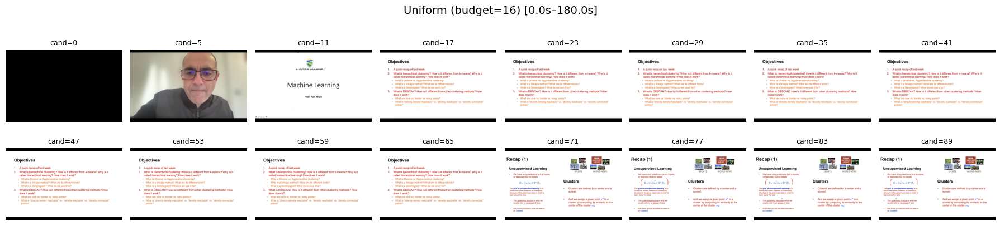

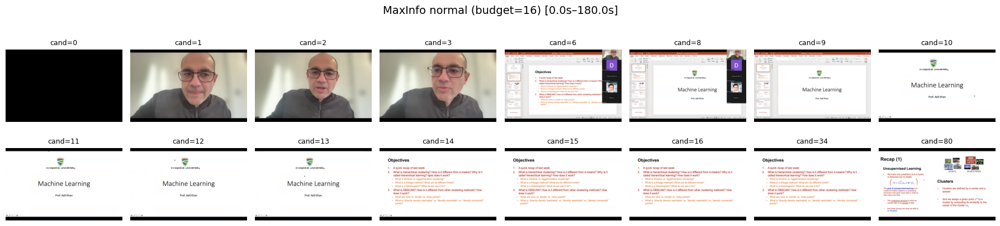

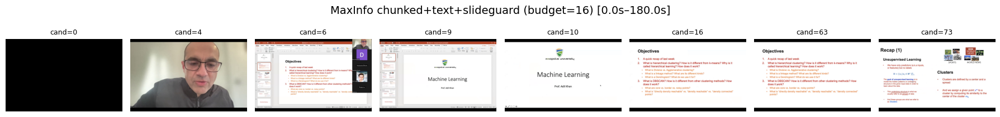

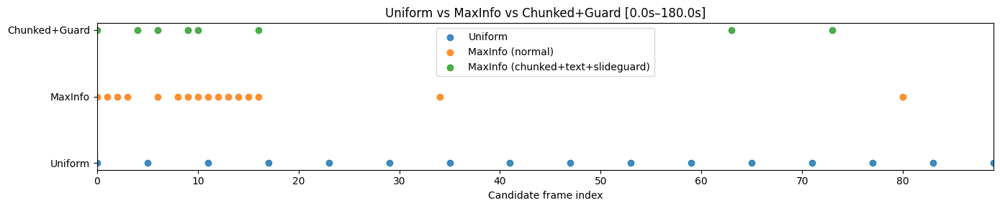

In [ ]:
# ============================================================
# EXAMPLE USAGE
# ============================================================
out = compare_three_methods(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    start_sec=0*60,
    end_sec=3*60,
    choose_fps=0.5,
    max_candidates=1024,
    budget=16,
    svd_rank=8,
    batch_size=16,
    similarity_thr=0.92,
    remove_similar_normal=False,
    remove_similar_chunked=True,
    chunk_seconds=120.0,   # or set num_chunks=10 and chunk_seconds=None
    slide_eps=0.06,
    languages=["en"],
    show=True,
    cols=8,
)


# QA via VLM

In [ ]:
!pip -q install "transformers==4.46.3" "tokenizers==0.20.3" "accelerate>=0.34.0" -U


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 103.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 123.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.3/566.3 kB 48.6 MB/s eta 0:00:00


In [ ]:
import torch
from transformers import AutoModel, AutoTokenizer

VLM_MODEL_NAME = "openbmb/MiniCPM-V-4_5"
# Optional: pin a revision to avoid re-downloading changed python files
# REVISION = "main"  # or a specific commit hash if you want reproducibility

_vlm = AutoModel.from_pretrained(
    VLM_MODEL_NAME,
    trust_remote_code=True,
    attn_implementation="sdpa",
    torch_dtype=torch.bfloat16,
    device_map="auto",
    # revision=REVISION,
).eval()

_vlm_tokenizer = AutoTokenizer.from_pretrained(
    VLM_MODEL_NAME,
    trust_remote_code=True,
    # revision=REVISION,
)
print("Loaded VLM:", type(_vlm))


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-4_5:
- modeling_navit_siglip.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


ImportError: cannot import name 'Qwen3Config' from 'transformers' (/usr/local/lib/python3.12/dist-packages/transformers/__init__.py)

In [ ]:
  import re
import copy
import torch
from transformers import AutoModel, AutoTokenizer

# -----------------------------
# Load VLM once (MiniCPM-V-4_5)
# -----------------------------
VLM_MODEL_NAME = "openbmb/MiniCPM-V-4_5"  # change if you use another VLM

_vlm = AutoModel.from_pretrained(
    VLM_MODEL_NAME,
    trust_remote_code=True,
    attn_implementation="sdpa",
    torch_dtype=torch.bfloat16,
    device_map="auto",
).eval()

_vlm_tokenizer = AutoTokenizer.from_pretrained(VLM_MODEL_NAME, trust_remote_code=True)


# -----------------------------
# Prompt helpers
# -----------------------------
def build_mcq_prompt(question, options, subtitle_text=""):
    """
    options: dict like {"A": "...", "B": "...", "C": "...", "D": "...", "E": "..."} (any subset)
    """
    instruct = (
        "Select the best answer to the following multiple-choice question based on the video.\n"
        "Respond with only the letter (A, B, C, D, or E) of the correct option.\n\n"
    )
    instruct += f"Question:\n{question}\n\nOptions:\n"
    for k in ["A","B","C","D","E"]:
        if k in options and options[k] is not None:
            instruct += f"{k}. {options[k]}\n"
    instruct += "\nThe best answer is: "

    if subtitle_text:
        instruct = f"This video's subtitles are listed below:\n{subtitle_text}\n\n" + instruct

    return instruct


def parse_letter(output_text):
    # robust extraction of A-E
    m = re.findall(r"[\(\ \[]*([A-E])[\)\.\ \]]*", str(output_text))
    return m[0] if m else None


# -----------------------------
# VLM call (MiniCPM style)
# -----------------------------
def vlm_answer_with_frames(vlm, tokenizer, frames, temporal_ids, prompt, max_slice_nums=1):
    """
    frames: list of PIL images
    temporal_ids: list of np arrays (same length as frames), per-frame temporal groups (your pipeline uses singletons)
    """
    msgs = [{"role": "user", "content": frames + [prompt]}]

    # MiniCPM-V chat signature (as in your notebook)
    out = vlm.chat(
        msgs=msgs,
        tokenizer=tokenizer,
        use_image_id=False,
        max_slice_nums=max_slice_nums,
        temporal_ids=temporal_ids,
    )
    return out


# -----------------------------
# Main: compare Uniform vs MaxInfo for QA
# -----------------------------
def compare_sampling_for_vlm_qa(
    video_path: str,
    question: str,
    options: dict,                 # {"A": "...", "B": "...", ...}
    subtitle_text: str = "",
    choose_fps: float = 3.0,
    max_candidates: int = 256,
    budget: int = 32,
    svd_rank: int = 8,
    clip_batch_size: int = 16,
    remove_similar: bool = False,
    similarity_thr: float = 0.9,
    show_frames: bool = True,
    cols: int = 8,
):
    # 1) decode candidates once
    frames, ts_group, orig_frame_idx, timestamps = encode_video_candidates(
        video_path=video_path,
        choose_fps=choose_fps,
        max_candidates=max_candidates,
    )

    # 2) sample two ways
    uni_frames, uni_ts, uni_idx = uniform_select(frames, ts_group, budget=budget)

    mi_frames, mi_ts, mi_idx = maxinfo_select(
        vision_model=_vision_model,
        vision_processor=_vision_processor,
        frames=frames,
        ts_group=ts_group,
        budget=budget,
        svd_rank=svd_rank,
        batch_size=clip_batch_size,
        remove_similar=remove_similar,
        similarity_thr=similarity_thr,
    )

    # 3) build prompt
    prompt = build_mcq_prompt(question, options, subtitle_text=subtitle_text)

    # 4) ask VLM
    torch.cuda.empty_cache()
    out_uni = vlm_answer_with_frames(_vlm, _vlm_tokenizer, uni_frames, uni_ts, prompt)
    ans_uni = parse_letter(out_uni)

    torch.cuda.empty_cache()
    out_mi = vlm_answer_with_frames(_vlm, _vlm_tokenizer, mi_frames, mi_ts, prompt)
    ans_mi = parse_letter(out_mi)

    # 5) show
    if show_frames:
        show_grid(uni_frames, uni_idx, title=f"Uniform (budget={budget}) — {video_path}", cols=cols)
        show_grid(mi_frames, mi_idx, title=f"MaxInfo (budget={budget}) — {video_path}", cols=cols)
        show_timeline(uni_idx, mi_idx, total_candidates=len(frames), title=f"Uniform vs MaxInfo timeline — {video_path}")

    print("=== VLM QA results ===")
    print("Uniform raw:", out_uni)
    print("Uniform parsed:", ans_uni)
    print("---")
    print("MaxInfo raw:", out_mi)
    print("MaxInfo parsed:", ans_mi)

    return {
        "video_path": video_path,
        "prompt": prompt,
        "uniform": {"indices": uni_idx, "answer_raw": out_uni, "answer_letter": ans_uni},
        "maxinfo": {"indices": mi_idx, "answer_raw": out_mi, "answer_letter": ans_mi},
        "candidates": {"num": len(frames), "orig_frame_idx": orig_frame_idx, "timestamps": timestamps},
    }


# -----------------------------
# Example usage
# -----------------------------
video_path = "/content/sample_long.mp4"

question = "What is the person doing in the video?"
options = {
    "A": "Cooking food",
    "B": "Playing a musical instrument",
    "C": "Driving a car",
    "D": "Swimming in a pool",
    "E": "None of the above",
}

subtitle_text = ""  # or pass subtitles you have

out = compare_sampling_for_vlm_qa(
    video_path=video_path,
    question=question,
    options=options,
    subtitle_text=subtitle_text,
    choose_fps=3.0,
    max_candidates=256,
    budget=32,
    svd_rank=8,
    clip_batch_size=16,
    remove_similar=False,
    show_frames=True,
)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

configuration_minicpm.py: 0.00B [00:00, ?B/s]

modeling_navit_siglip.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-4_5:
- modeling_navit_siglip.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-4_5:
- configuration_minicpm.py
- modeling_navit_siglip.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
`torch_dtype` is deprecated! Use `dtype` instead!


modeling_minicpmv.py: 0.00B [00:00, ?B/s]

resampler.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-4_5:
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-4_5:
- modeling_minicpmv.py
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

AttributeError: 'MiniCPMV' object has no attribute 'all_tied_weights_keys'

# Experiment pipeline 2

In [1]:
!pip install decord transformers torch pillow scipy easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 53.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 60.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.2/978.2 kB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.6/300.6 kB 24.0 MB/s eta 0:00:00


In [4]:
# Pipeline cell: Uniform vs (Paper-like) MaxInfo (SVD + RectMaxVol w/ tolerance)
import math, numpy as np, torch
import matplotlib.pyplot as plt
from PIL import Image
from decord import VideoReader, cpu
from scipy.spatial import cKDTree
from scipy.spatial.distance import cosine
from transformers import AutoProcessor, CLIPModel

TIME_SCALE = 0.1

# -----------------------------
# Core utils (decode + ids)
# -----------------------------
def _uniform_sample_indices(num_items: int, n: int) -> np.ndarray:
    n = max(1, min(int(n), int(num_items)))
    gap = num_items / n
    idxs = [int(i * gap + gap / 2) for i in range(n)]
    return np.clip(idxs, 0, num_items - 1).astype(np.int64)

def _map_to_nearest_scale(values: np.ndarray, scale: np.ndarray) -> np.ndarray:
    tree = cKDTree(scale[:, None])
    _, indices = tree.query(values[:, None])
    return scale[indices]

def load_video_segment(
    video_path: str,
    fps_sample: float = 1.0,
    max_candidates: int = 256,
    start_sec: float | None = None,
    end_sec: float | None = None,
    force_sample: bool = True,
):
    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    native_fps = float(vr.get_avg_fps())
    total_frames = len(vr)
    duration = total_frames / native_fps

    s = 0.0 if start_sec is None else max(0.0, float(start_sec))
    e = duration if end_sec is None else min(duration, float(end_sec))
    if e <= s:
        raise ValueError(f"Invalid segment: start_sec={s}, end_sec={e}, duration={duration:.2f}")

    start_f = int(round(s * native_fps))
    end_f = int(round(e * native_fps))
    end_f = min(end_f, total_frames)

    step = max(1, int(round(native_fps / fps_sample)))
    frame_idx = list(range(start_f, end_f, step))

    if force_sample and len(frame_idx) > max_candidates:
        frame_idx = np.linspace(start_f, end_f - 1, max_candidates, dtype=int).tolist()

    frames_np = vr.get_batch(frame_idx).asnumpy()
    timestamps = [i / native_fps for i in frame_idx]
    return frames_np, timestamps, frame_idx, (s, e), duration, native_fps

def encode_video_candidates(
    video_path: str,
    choose_fps: float = 3.0,
    max_candidates: int = 256,
    start_sec: float | None = None,
    end_sec: float | None = None,
    time_scale: float = TIME_SCALE,
):
    frames_np, timestamps, orig_frame_idx, (seg_s, seg_e), duration, fps = load_video_segment(
        video_path=video_path,
        fps_sample=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        force_sample=True,
    )

    # Convert to PIL for CLIP + grid plotting (keep consistent!)
    frames = [Image.fromarray(x.astype("uint8")).convert("RGB") for x in frames_np]

    # temporal ids (paper doesn't require this, but keep your interface)
    ts = np.array(timestamps, dtype=np.float32)
    scale = np.arange(0, max(duration, time_scale), time_scale, dtype=np.float32)
    snapped = _map_to_nearest_scale(ts, scale)
    ts_id = (snapped / time_scale).astype(np.int32)
    ts_group = [np.array([t], dtype=np.int32) for t in ts_id]

    return frames, ts_group, orig_frame_idx, timestamps

# -----------------------------
# CLIP embeddings
# -----------------------------
def extract_clip_features(vision_model, vision_processor, frames, batch_size=16):
    device = vision_model.device
    all_feats = []
    with torch.no_grad():
        for i in range(0, len(frames), batch_size):
            batch = frames[i:i + batch_size]
            inputs = vision_processor(images=batch, return_tensors="pt", padding=True)
            inputs = {k: v.to(device) for k, v in inputs.items() if torch.is_tensor(v)}
            vision_out = vision_model.vision_model(pixel_values=inputs["pixel_values"])
            pooled = vision_out.pooler_output
            feats = vision_model.visual_projection(pooled)
            all_feats.append(feats.float().cpu())
    return torch.cat(all_feats, dim=0)  # [T, D]

# -----------------------------
# Paper-like MaxInfo: SVD(U) + RectMaxVol (tolerance)
# -----------------------------
def svd_reduce_dim(features: np.ndarray, r: int = 8) -> np.ndarray:
    # Q in paper is [n, d]. We compute U from SVD and keep first r columns.
    U, S, Vt = np.linalg.svd(features, full_matrices=False)
    return U[:, :r]  # Qs in paper

def _row_norms_sq(X: np.ndarray) -> np.ndarray:
    return np.sum(X * X, axis=1)

def rect_maxvol_greedy(Qs: np.ndarray, tol: float = 0.3, maxK: int | None = None, seed: int | None = None):
    """
    Training-free, library-free rectangular MaxVol-like row selection.

    Idea (matches paper behavior):
      - Select an initial square "basis" of r rows.
      - Maintain a coefficient matrix C = Qs @ pinv(B), where B are selected rows.
      - Repeatedly add the row with the largest ||C_i|| until max ||C_i|| <= tol or maxK reached.

    Returns:
      piv: list of selected row indices
    """
    n, r = Qs.shape
    if n == 0:
        return []
    if maxK is None:
        maxK = n
    maxK = int(max(1, min(maxK, n)))

    rng = np.random.default_rng(seed)

    # 1) pick r initial rows that are reasonably independent:
    #    Use greedy farthest-point on Qs as a simple, stable init (no extra libs).
    piv = [int(np.argmax(_row_norms_sq(Qs)))]
    while len(piv) < min(r, n):
        # choose the row farthest from span of chosen rows (approx using residual to centroid for cheap init)
        chosen = Qs[piv]
        centroid = chosen.mean(axis=0, keepdims=True)
        d2 = _row_norms_sq(Qs - centroid)
        cand = int(np.argmax(d2))
        if cand in piv:
            cand = int(rng.integers(0, n))
        piv.append(cand)

    # if n < r, we're done
    piv = list(dict.fromkeys(piv))  # unique keep order
    if len(piv) >= n:
        return sorted(piv)

    def compute_C(Qs, piv):
        B = Qs[piv, :]                         # [k, r]
        # pseudoinverse gives least-squares coefficients
        Binv = np.linalg.pinv(B)               # [r, k]
        C = Qs @ Binv                          # [n, k]
        return C

    # 2) Greedy rectangular maxvol growth based on tolerance
    while True:
        C = compute_C(Qs, piv)
        cnorm = np.linalg.norm(C, axis=1)      # ||C_i||_2 per row

        # Ignore already selected rows (so we don't re-add them)
        cnorm_sel = cnorm.copy()
        cnorm_sel[piv] = -np.inf

        i_star = int(np.argmax(cnorm_sel))
        best = float(cnorm_sel[i_star])

        # stopping rule (paper-like): stop when max coefficient norm <= tol
        if best <= tol:
            break

        piv.append(i_star)
        if len(piv) >= maxK:
            break

    return sorted(set(piv))

def maxinfo_select(
    vision_model,
    vision_processor,
    frames,
    ts_group,
    budget: int = 32,
    svd_rank: int = 8,
    tol: float = 0.3,
    batch_size: int = 16,
    remove_similar: bool = False,   # not in paper; keep optional
    similarity_thr: float = 0.9,
):
    feats = extract_clip_features(vision_model, vision_processor, frames, batch_size=batch_size).numpy()
    Qs = svd_reduce_dim(feats, r=svd_rank)

    # paper: rect_maxvol(Qs, tol) -> piv (size adapts). We cap to budget for fair comparison.
    piv = rect_maxvol_greedy(Qs, tol=tol, maxK=len(frames))

    # enforce budget (paper slow version: downsample if too many)
    if len(piv) > budget:
        keep = np.linspace(0, len(piv) - 1, budget).astype(int).tolist()
        piv = [piv[i] for i in keep]

    # optional post-dedup (not paper)
    if remove_similar and len(piv) > 1:
        kept = [piv[0]]
        for idx in piv[1:]:
            sim = 1.0 - cosine(feats[kept[-1]], feats[idx])
            if sim < similarity_thr:
                kept.append(idx)
        piv = kept

    sel_frames = [frames[i] for i in piv]
    sel_ts = [ts_group[i] for i in piv]
    return sel_frames, sel_ts, piv

# -----------------------------
# Uniform baseline
# -----------------------------
def uniform_select(frames, ts_group, budget: int = 32):
    T = len(frames)
    k = min(budget, T)
    idx = np.linspace(0, T - 1, k).astype(int).tolist()
    return [frames[i] for i in idx], [ts_group[i] for i in idx], idx

# -----------------------------
# Visualizations
# -----------------------------
def show_grid(frames, idx, title, cols=8):
    n = len(frames)
    rows = math.ceil(n / cols)
    plt.figure(figsize=(cols * 2.25, rows * 2.25))
    for i, (im, j) in enumerate(zip(frames, idx), start=1):
        ax = plt.subplot(rows, cols, i)
        ax.imshow(im)
        ax.set_title(f"cand={j}", fontsize=9)
        ax.axis("off")
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

def show_timeline(uniform_idx, maxinfo_idx, total_candidates, title="Selection timeline"):
    u = np.array(uniform_idx, dtype=int)
    m = np.array(maxinfo_idx, dtype=int)
    plt.figure(figsize=(14, 2.4))
    plt.scatter(u, np.zeros_like(u), label="Uniform", alpha=0.85)
    plt.scatter(m, np.ones_like(m), label="MaxInfo", alpha=0.85)
    plt.yticks([0, 1], ["Uniform", "MaxInfo"])
    plt.xlim(0, total_candidates - 1)
    plt.xlabel("Candidate frame index")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

# -----------------------------
# Model + compare function
# -----------------------------
_CLIP_MODEL_NAME = "openai/clip-vit-large-patch14-336"
_vision_model = CLIPModel.from_pretrained(_CLIP_MODEL_NAME, device_map="auto").eval()
_vision_processor = AutoProcessor.from_pretrained(_CLIP_MODEL_NAME)

def compare_sampling_on_video(
    video_path: str,
    choose_fps: float = 3.0,
    max_candidates: int = 256,
    budget: int = 32,
    svd_rank: int = 8,
    tol: float = 0.3,
    batch_size: int = 16,
    remove_similar: bool = False,
    similarity_thr: float = 0.9,
    cols: int = 8,
    show: bool = True,
    start_sec: float | None = None,
    end_sec: float | None = None,
):
    frames, ts_group, orig_frame_idx, timestamps = encode_video_candidates(
        video_path=video_path,
        choose_fps=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
    )

    uni_frames, uni_ts, uni_idx = uniform_select(frames, ts_group, budget=budget)

    mi_frames, mi_ts, mi_idx = maxinfo_select(
        vision_model=_vision_model,
        vision_processor=_vision_processor,
        frames=frames,
        ts_group=ts_group,
        budget=budget,
        svd_rank=svd_rank,
        tol=tol,
        batch_size=batch_size,
        remove_similar=remove_similar,     # optional: not paper
        similarity_thr=similarity_thr,
    )

    if show:
        seg_label = (
            f"[{start_sec:.2f}s–{end_sec:.2f}s]"
            if (start_sec is not None or end_sec is not None)
            else "[full]"
        )
        show_grid(uni_frames, uni_idx, title=f"Uniform (budget={budget}) {seg_label} — {video_path}", cols=cols)
        show_grid(mi_frames, mi_idx, title=f"MaxInfo (tol={tol}, rank={svd_rank}, budget={budget}) {seg_label} — {video_path}", cols=cols)
        show_timeline(uni_idx, mi_idx, total_candidates=len(frames),
                      title=f"Uniform vs MaxInfo timeline {seg_label} — {video_path}")

    return {
        "video_path": video_path,
        "segment": {"start_sec": 0.0 if start_sec is None else float(start_sec),
                    "end_sec": None if end_sec is None else float(end_sec)},
        "candidates": {"num": len(frames), "orig_frame_idx": orig_frame_idx, "timestamps": timestamps},
        "uniform": {"indices": uni_idx, "frames": uni_frames, "ts_group": uni_ts},
        "maxinfo": {"indices": mi_idx, "frames": mi_frames, "ts_group": mi_ts},
    }




Loading weights:   0%|          | 0/590 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-large-patch14-336
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


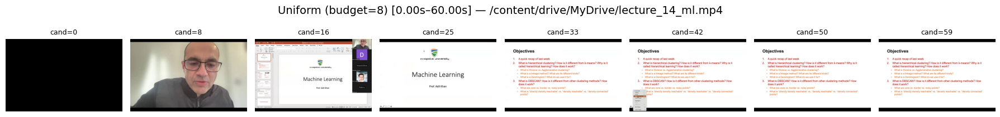

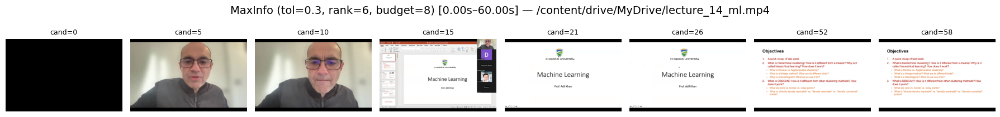

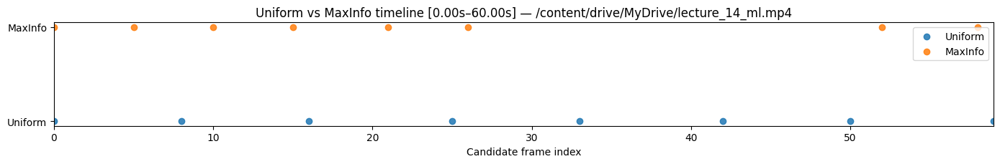

In [ ]:
# -----------------------------
# Example usage
# -----------------------------
out = compare_sampling_on_video(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=1.0,
    max_candidates=256,
    budget=8,
    svd_rank=6,
    tol=0.3,
    batch_size=16,
    remove_similar=False,   # set True only if you want "MaxInfo + dedup"
    start_sec=0*60,
    end_sec=1*60,
)

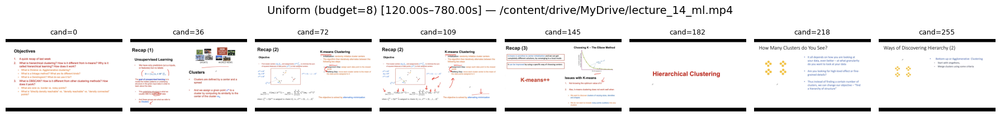

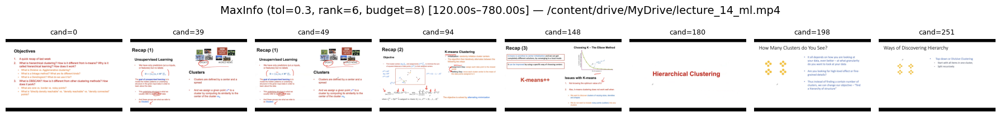

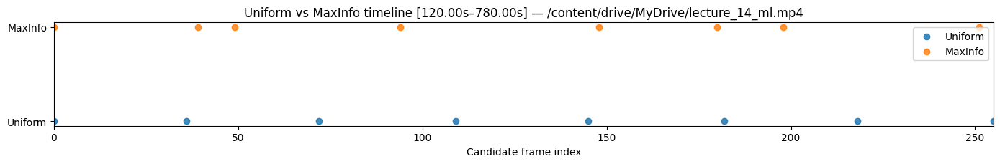

In [ ]:
# -----------------------------
# Example usage
# -----------------------------
out = compare_sampling_on_video(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=1.0,
    max_candidates=256,
    budget=8,
    svd_rank=6,
    tol=0.3,
    batch_size=16,
    remove_similar=False,   # set True only if you want "MaxInfo + dedup"
    start_sec=2*60,
    end_sec=13*60,
)

## pre-filtering

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from decord import VideoReader, cpu

def load_video_frames_at_fps(video_path, target_fps=1.0):
    vr = VideoReader(video_path, ctx=cpu(0))
    native_fps = float(vr.get_avg_fps())
    step = max(1, int(round(native_fps / target_fps)))
    idx = list(range(0, len(vr), step))
    frames = vr.get_batch(idx).asnumpy()
    return frames



In [6]:
from decord import VideoReader, cpu
import numpy as np

def iter_sampled_frames_segment(video_path, fps_sample=1.0, start_sec=0.0, end_sec=None):
    """
    Yields (frame_index, timestamp_sec, frame_rgb_uint8) for a time segment,
    sampled at approximately fps_sample, without loading all frames.
    """
    vr = VideoReader(video_path, ctx=cpu(0), num_threads=1)
    native_fps = float(vr.get_avg_fps())
    total_frames = len(vr)
    duration = total_frames / native_fps

    s = max(0.0, float(start_sec))
    e = duration if end_sec is None else min(duration, float(end_sec))
    if e <= s:
        raise ValueError(f"Invalid segment: start_sec={s}, end_sec={e}, duration={duration:.2f}")

    start_f = int(round(s * native_fps))
    end_f = int(round(e * native_fps))
    end_f = min(end_f, total_frames)

    step = max(1, int(round(native_fps / float(fps_sample))))

    for idx in range(start_f, end_f, step):
        ts = idx / native_fps
        yield idx, ts, vr[idx].asnumpy()


In [7]:
def filter_similar_frames_stream_segment(
    video_path,
    fps_sample=1.0,
    start_sec=0.0,
    end_sec=None,
    resize_hw=(32, 32),
    change_threshold=6.0,
    keep_first=True,
    max_kept_frames=64,
):
    kept_indices, kept_timestamps, kept_frames = [], [], []
    change_scores = []

    prev_small = None
    first = True
    sampled_count = 0   # NEW

    for idx, ts, frame in iter_sampled_frames_segment(
        video_path, fps_sample=fps_sample, start_sec=start_sec, end_sec=end_sec
    ):
        sampled_count += 1   # count sampled frames

        gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
        small = cv2.resize(gray, resize_hw, interpolation=cv2.INTER_AREA)

        if first:
            if keep_first:
                kept_indices.append(idx)
                kept_timestamps.append(ts)
                if len(kept_frames) < max_kept_frames:
                    kept_frames.append(frame)
            prev_small = small
            first = False
            continue

        diff = float(np.mean(np.abs(small.astype(np.float32) - prev_small.astype(np.float32))))
        change_scores.append(diff)

        if diff >= change_threshold:
            kept_indices.append(idx)
            kept_timestamps.append(ts)
            if len(kept_frames) < max_kept_frames:
                kept_frames.append(frame)
            prev_small = small

    return sampled_count, kept_indices, kept_timestamps, kept_frames, change_scores


In [8]:
import matplotlib.pyplot as plt
from math import ceil

def show_frames_grid(frames, labels, cols=8, title="Kept frames"):
    n = len(frames)
    rows = ceil(n / cols)
    plt.figure(figsize=(cols * 2.2, rows * 2.2))
    for i, (f, lab) in enumerate(zip(frames, labels)):
        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(f)
        ax.set_title(lab, fontsize=8)
        ax.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def plot_change_scores(scores, title="Change scores (consecutive sampled frames)"):
    plt.figure(figsize=(12, 3))
    plt.plot(scores)
    plt.xlabel("Sample step (t → t+1)")
    plt.ylabel("Mean abs pixel diff")
    plt.title(title)
    plt.tight_layout()
    plt.show()


In [ ]:
video_path = "/content/drive/MyDrive/lecture_14_ml.mp4"

sampled_n, kept_idx, kept_ts, kept_frames, change_scores = \
    filter_similar_frames_stream_segment(
        video_path=video_path,
        fps_sample=1.0,
        # start_sec=0*60,
        # end_sec=100*60,
        resize_hw=(128, 128),
        change_threshold=3.0,
        max_kept_frames=48,
    )




Initial sampled frames (@1 fps): 4390
Frames kept after change-based filtering: 152
Reduction ratio: 0.965
Kept 152 frames in segment.
First few kept timestamps (sec): [0.0, 1.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0]


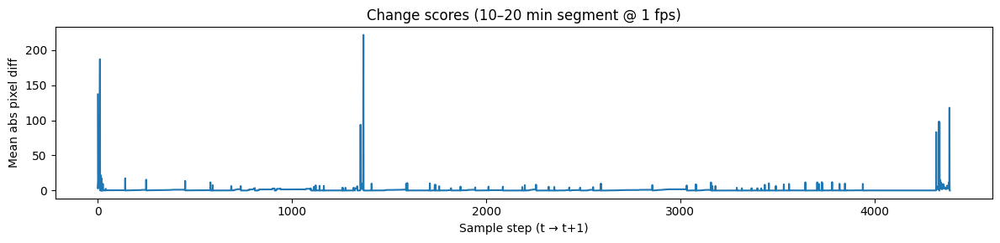

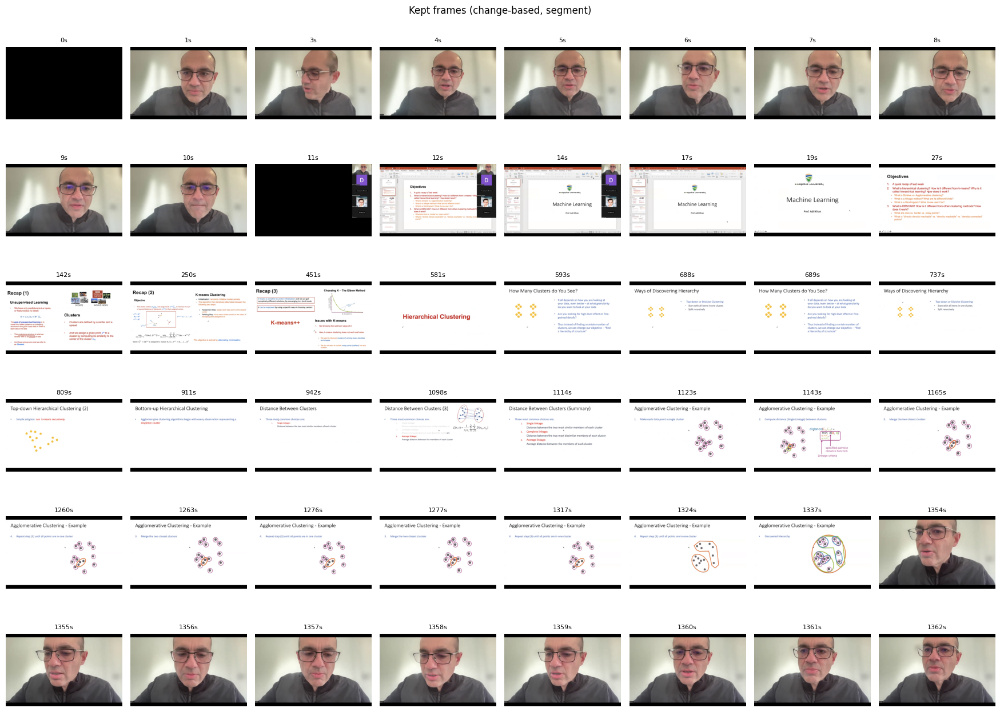

In [ ]:
print(f"Initial sampled frames (@1 fps): {sampled_n}")
print(f"Frames kept after change-based filtering: {len(kept_idx)}")
print(f"Reduction ratio: {(1 - (len(kept_idx) / sampled_n)):.3f}")
print(f"Kept {len(kept_idx)} frames in segment.")
print("First few kept timestamps (sec):", kept_ts[:10])

plot_change_scores(change_scores, title="Change scores (10–20 min segment @ 1 fps)")
labels = [f"{t:.0f}s" for t in kept_ts[:len(kept_frames)]]
show_frames_grid(kept_frames, labels, cols=8, title="Kept frames (change-based, segment)")

Initial sampled frames (@1 fps): 600
Frames kept after change-based filtering: 21
Reduction ratio: 0.965
Kept 21 frames in segment.
First few kept timestamps (sec): [0.0, 1.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0]


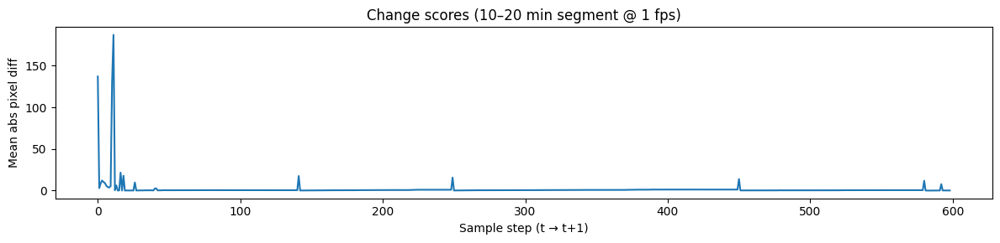

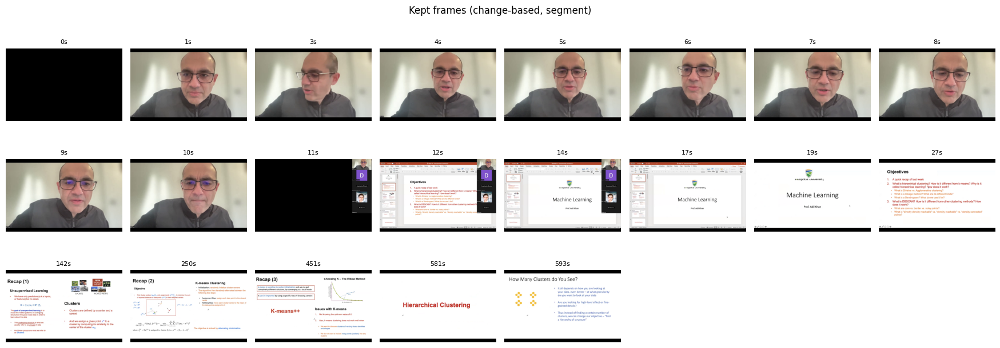

In [ ]:
print(f"Initial sampled frames (@1 fps): {sampled_n}")
print(f"Frames kept after change-based filtering: {len(kept_idx)}")
print(f"Reduction ratio: {(1 - (len(kept_idx) / sampled_n)):.3f}")
print(f"Kept {len(kept_idx)} frames in segment.")
print("First few kept timestamps (sec):", kept_ts[:10])

plot_change_scores(change_scores, title="Change scores (10–20 min segment @ 1 fps)")
labels = [f"{t:.0f}s" for t in kept_ts[:len(kept_frames)]]
show_frames_grid(kept_frames, labels, cols=8, title="Kept frames (change-based, segment)")

In [ ]:
video_path = "/content/drive/MyDrive/lecture_14_ml.mp4"

kept_idx, kept_ts, kept_frames, change_scores = filter_similar_frames_stream_segment(
    video_path=video_path,
    fps_sample=1.0,            # changeable
    start_sec=0*60,
    end_sec=1*60,
    resize_hw=(64, 64),
    change_threshold=3.0,      # tune this
    keep_first=True,
    max_kept_frames=48,        # plot at most 48 kept frames
)

print(f"Kept {len(kept_idx)} frames in segment.")
print("First few kept timestamps (sec):", kept_ts[:10])

plot_change_scores(change_scores, title="Change scores (10–20 min segment @ 1 fps)")
labels = [f"{t:.0f}s" for t in kept_ts[:len(kept_frames)]]
show_frames_grid(kept_frames, labels, cols=8, title="Kept frames (change-based, segment)")


Initial sampled frames (@1 fps): 60
Frames kept after change-based filtering: 1
Reduction ratio: 0.017


In [ ]:
20

In [9]:
import cv2
def change_dedup_indices(
    frames_np: np.ndarray,
    resize_hw=(32, 32),
    change_threshold: float = 6.0,
    keep_first: bool = True,
):
    """
    Decide which consecutive frames to keep based on pixel change.
    Operates on numpy frames already in memory (segment/candidate frames).

    Returns:
      keep_mask: np.ndarray[bool] of length T
      change_scores: list[float] length T-1
    """
    T = len(frames_np)
    if T == 0:
        return np.zeros((0,), dtype=bool), []
    keep = np.zeros((T,), dtype=bool)
    if keep_first:
        keep[0] = True

    change_scores = []

    prev = cv2.cvtColor(frames_np[0], cv2.COLOR_RGB2GRAY)
    prev = cv2.resize(prev, resize_hw, interpolation=cv2.INTER_AREA)

    for i in range(1, T):
        curr = cv2.cvtColor(frames_np[i], cv2.COLOR_RGB2GRAY)
        curr = cv2.resize(curr, resize_hw, interpolation=cv2.INTER_AREA)

        diff = float(np.mean(np.abs(curr.astype(np.float32) - prev.astype(np.float32))))
        change_scores.append(diff)

        if diff >= change_threshold:
            keep[i] = True
            prev = curr  # update reference only when we keep

    return keep, change_scores
def uniform_select(frames, ts_group, budget: int = 32):
    T = len(frames)
    k = min(budget, T)
    idx = np.linspace(0, T - 1, k).round().astype(int).tolist()
    idx = sorted(set(idx))  # avoid duplicates for small T
    return [frames[i] for i in idx], [ts_group[i] for i in idx], idx



TIME_SCALE = 0.1
def encode_video_candidates(
    video_path: str,
    choose_fps: float = 3.0,
    max_candidates: int = 256,
    start_sec: float | None = None,
    end_sec: float | None = None,
    time_scale: float = TIME_SCALE,
    use_change_dedup: bool = True,
    change_resize_hw=(32, 32),
    change_threshold: float = 6.0,
):
    frames_np, timestamps, orig_frame_idx, (seg_s, seg_e), duration, fps = load_video_segment(
        video_path=video_path,
        fps_sample=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        force_sample=True,
    )

    # ---- RAW (for true uniform baseline) ----
    raw_frames_np = frames_np
    raw_timestamps = timestamps
    raw_orig_frame_idx = orig_frame_idx

    # ---- DEDUP (for MaxInfo pipeline) ----
    initial_n = len(frames_np)
    if use_change_dedup and initial_n > 1:
        keep_mask, change_scores = change_dedup_indices(
            frames_np,
            resize_hw=change_resize_hw,
            change_threshold=change_threshold,
            keep_first=True,
        )
        frames_np = frames_np[keep_mask]
        timestamps = [t for t, k in zip(timestamps, keep_mask) if k]
        orig_frame_idx = [fi for fi, k in zip(orig_frame_idx, keep_mask) if k]
    else:
        keep_mask = np.ones((initial_n,), dtype=bool)
        change_scores = []

    # Convert both to PIL (consistent)
    raw_frames = [Image.fromarray(x.astype("uint8")).convert("RGB") for x in raw_frames_np]
    dedup_frames = [Image.fromarray(x.astype("uint8")).convert("RGB") for x in frames_np]

    # temporal ids function (helper)
    def build_ts_group(ts_list):
        ts = np.array(ts_list, dtype=np.float32)
        scale = np.arange(0, max(duration, time_scale), time_scale, dtype=np.float32)
        snapped = _map_to_nearest_scale(ts, scale)
        ts_id = (snapped / time_scale).astype(np.int32)
        return [np.array([t], dtype=np.int32) for t in ts_id]

    raw_ts_group = build_ts_group(raw_timestamps)
    dedup_ts_group = build_ts_group(timestamps)

    meta = {
        "raw_candidates": len(raw_frames),
        "dedup_candidates": len(dedup_frames),
        "change_scores": change_scores,
        "keep_mask": keep_mask,
    }

    return (
        # raw
        raw_frames, raw_ts_group, raw_orig_frame_idx, raw_timestamps,
        # dedup
        dedup_frames, dedup_ts_group, orig_frame_idx, timestamps,
        meta
    )


# -----------------------------
# Model + compare function
# -----------------------------
_CLIP_MODEL_NAME = "openai/clip-vit-large-patch14-336"
_vision_model = CLIPModel.from_pretrained(_CLIP_MODEL_NAME, device_map="auto").eval()
_vision_processor = AutoProcessor.from_pretrained(_CLIP_MODEL_NAME)

def compare_sampling_on_video(
    video_path: str,
    choose_fps: float = 3.0,
    max_candidates: int = 256,
    budget: int = 32,
    svd_rank: int = 8,
    tol: float = 0.3,
    batch_size: int = 16,
    remove_similar: bool = False,
    similarity_thr: float = 0.9,
    cols: int = 8,
    show: bool = True,
    start_sec: float | None = None,
    end_sec: float | None = None,
):
    (
        raw_frames, raw_ts_group, raw_orig_idx, raw_timestamps,
        dedup_frames, dedup_ts_group, dedup_orig_idx, dedup_timestamps,
        meta
    ) = encode_video_candidates(
        video_path=video_path,
        choose_fps=choose_fps,
        max_candidates=max_candidates,
        start_sec=start_sec,
        end_sec=end_sec,
        use_change_dedup=True,
        change_resize_hw=(32, 32),
        change_threshold=6.0,
    )

    print(f"Initial sampled frames (@{choose_fps} fps): {meta['raw_candidates']}")
    print(f"After change-dedup (MaxInfo candidates): {meta['dedup_candidates']}")

    # TRUE uniform baseline on RAW candidates
    uni_frames, uni_ts, uni_idx = uniform_select(raw_frames, raw_ts_group, budget=budget)
    uni_orig_idx = [raw_orig_idx[i] for i in uni_idx]

    # MaxInfo on DEDUP candidates
    mi_frames, mi_ts, mi_idx = maxinfo_select(
        vision_model=_vision_model,
        vision_processor=_vision_processor,
        frames=dedup_frames,
        ts_group=dedup_ts_group,
        budget=budget,
        svd_rank=svd_rank,
        tol=tol,
        batch_size=batch_size,
        remove_similar=remove_similar,
        similarity_thr=similarity_thr,
    )
    mi_orig_idx = [dedup_orig_idx[i] for i in mi_idx]

    if show:
        seg_label = (
            f"[{start_sec:.2f}s–{end_sec:.2f}s]"
            if (start_sec is not None or end_sec is not None)
            else "[full]"
        )
        show_grid(uni_frames, uni_idx, title=f"Uniform (budget={budget}) {seg_label} — {video_path}", cols=cols)
        show_grid(mi_frames, mi_idx, title=f"MaxInfo (tol={tol}, rank={svd_rank}, budget={budget}) {seg_label} — {video_path}", cols=cols)

        uni_ts_sec = [raw_timestamps[i] for i in uni_idx]
        mi_ts_sec  = [dedup_timestamps[i] for i in mi_idx]
        show_timeline_seconds(uni_ts_sec, mi_ts_sec, title="Uniform vs MaxInfo timeline (seconds)")



    return {
        "video_path": video_path,
        "segment": {"start_sec": 0.0 if start_sec is None else float(start_sec),
                    "end_sec": None if end_sec is None else float(end_sec)},
        "candidates": {
            "raw_num": meta["raw_candidates"],
            "dedup_num": meta["dedup_candidates"],
            "raw_orig_frame_idx": raw_orig_idx,
            "dedup_orig_frame_idx": dedup_orig_idx,
        },
        "uniform": {
            "candidate_indices": uni_idx,
            "orig_frame_indices": uni_orig_idx,
            "frames": uni_frames,
            "ts_group": uni_ts,
        },
        "maxinfo": {
            "candidate_indices": mi_idx,
            "orig_frame_indices": mi_orig_idx,
            "frames": mi_frames,
            "ts_group": mi_ts,
        },
    }

def show_timeline_seconds(uniform_ts, maxinfo_ts, title="Selection timeline (seconds)"):
    u = np.array(uniform_ts, dtype=float)
    m = np.array(maxinfo_ts, dtype=float)
    plt.figure(figsize=(14, 2.4))
    plt.scatter(u, np.zeros_like(u), label="Uniform", alpha=0.85)
    plt.scatter(m, np.ones_like(m), label="MaxInfo", alpha=0.85)
    plt.yticks([0, 1], ["Uniform", "MaxInfo"])
    plt.xlabel("Time (seconds)")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()






Loading weights:   0%|          | 0/590 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-large-patch14-336
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Initial sampled frames (@1.0 fps): 120
After change-dedup (MaxInfo candidates): 12


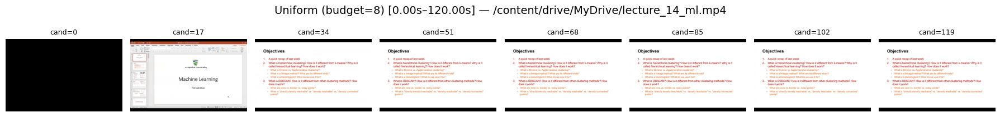

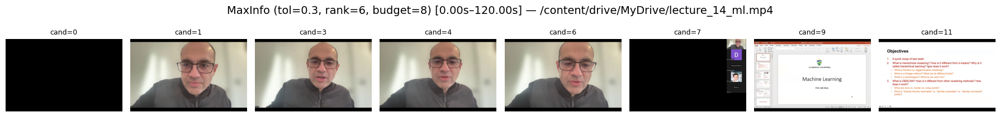

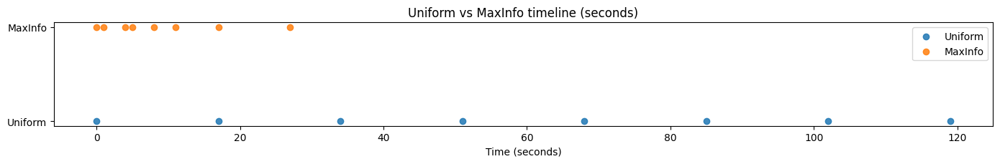

In [15]:
out = compare_sampling_on_video(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=1.0,
    max_candidates=256,
    budget=8,
    svd_rank=6,
    tol=0.3,
    batch_size=16,
    remove_similar=False,
    start_sec=0*60,
    end_sec=2*60,
)


In [ ]:
out = compare_sampling_on_video(
    video_path="/content/drive/MyDrive/lecture_14_ml.mp4",
    choose_fps=0.2,
    max_candidates=20*60,
    budget=32,
    svd_rank=6,
    tol=0.3,
    batch_size=16,
    remove_similar=False,
    start_sec=0*60,
    end_sec=20*60,
)
